In [1]:
import os
import json
from PIL import Image
from sklearn.preprocessing import LabelEncoder
import numpy as np
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay, f1_score
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from collections import Counter
import matplotlib.pyplot as plt
import torch.utils.data as data



from torchvision import transforms
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split
from torch.utils.data import Subset


import torchvision.models as models
import torch.nn as nn
from torchvision.models import efficientnet_b4, EfficientNet_B4_Weights


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
class CustomImageDataset(Dataset):
    def __init__(self, img_dir, transform=None):
        self.img_paths = []
        self.img_names = []
        self.labels = []
        self.transform = transform
        self.img_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff'}

        for label_folder in sorted(os.listdir(img_dir)):
            folder_path = os.path.join(img_dir, label_folder)
            if os.path.isdir(folder_path):
                for fname in sorted(os.listdir(folder_path)):
                    ext = os.path.splitext(fname)[1].lower()
                    if ext in self.img_extensions:
                        self.img_paths.append(os.path.join(folder_path, fname))
                        self.img_names.append(os.path.splitext(fname)[0])
                        self.labels.append(label_folder)

        self.label_encoder = LabelEncoder()
        self.encoded_labels = self.label_encoder.fit_transform(self.labels)

        print("Label mapping:")
        for i, label in enumerate(self.label_encoder.classes_):
            print(f"{i}: {label}")

        self._plot_class_distribution()

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        label = self.encoded_labels[idx]
        image_name = self.img_names[idx]

        image = Image.open(img_path).convert("RGB")
        if self.transform:
            image = self.transform(image)

        return image, label, image_name
    def _plot_class_distribution(self):
        counter = Counter(self.labels)
        classes = list(counter.keys())
        counts = list(counter.values())

        plt.figure(figsize=(10, 6))
        bars = plt.bar(classes, counts, color='skyblue')
        plt.xticks(rotation=45, ha='right')
        plt.xlabel("Class")
        plt.ylabel("Number of images")
        plt.title("Class Distribution in Dataset")
        plt.tight_layout()

        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2.0, yval + 5, int(yval), ha='center', va='bottom')

        plt.show()

    def get_label_encoder(self):
      return self.label_encoder




import os
from PIL import Image
from torch.utils.data import Dataset
from sklearn.preprocessing import LabelEncoder
from collections import Counter
import matplotlib.pyplot as plt
import re

class CustomImageDatasetSorted(Dataset):
    def __init__(self, img_dir, transform=None):
        self.transform = transform
        self.img_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff'}

        entries = []
        for label_folder in os.listdir(img_dir):
            folder_path = os.path.join(img_dir, label_folder)
            if not os.path.isdir(folder_path):
                continue
            for fname in os.listdir(folder_path):
                ext = os.path.splitext(fname)[1].lower()
                if ext in self.img_extensions:
                    match = re.search(r'(\d+)', fname)
                    frame_no = int(match.group(1)) if match else -1
                    entries.append((os.path.join(folder_path, fname),
                                    label_folder,
                                    fname[:-len(ext)],
                                    frame_no))

        entries.sort(key=lambda x: x[3])
        self.img_paths, self.labels, self.img_names, _ = zip(*entries)

        self.label_encoder = LabelEncoder()
        self.encoded_labels = self.label_encoder.fit_transform(self.labels)

        print("Label mapping:")
        for i, label in enumerate(self.label_encoder.classes_):
            print(f"{i}: {label}")

        self._plot_class_distribution()

    def get_label_encoder(self):
      return self.label_encoder

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        path = self.img_paths[idx]
        label = self.encoded_labels[idx]
        name  = self.img_names[idx]

        img = Image.open(path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, label, name

    def _plot_class_distribution(self):
        counter = Counter(self.labels)
        classes = list(counter.keys())
        counts  = list(counter.values())

        plt.figure(figsize=(10, 6))
        bars = plt.bar(classes, counts, color='skyblue')
        plt.xticks(rotation=45, ha='right')
        plt.xlabel("Class")
        plt.ylabel("Number of images")
        plt.title("Class Distribution in Dataset")
        plt.tight_layout()

        for bar in bars:
            yval = bar.get_height()
            plt.text(bar.get_x() + bar.get_width()/2.0,
                     yval + 5,
                     int(yval),
                     ha='center', va='bottom')
        plt.show()


In [4]:
def load_data(transform, shuffle, sorted):
  batch_size = 8

  if sorted:
    print("sorted")
    dataset = CustomImageDatasetSorted(img_dir='drive/MyDrive/ski_pose_classifier/gs_training_fps10_sorted',
                             transform=transform)
  else:
    print("not sorted")
    dataset = CustomImageDataset(img_dir='drive/MyDrive/ski_pose_classifier/gs_training_fps10_sorted',
                             transform=transform)

  full_indices = list(range(len(dataset)))
  label_encoder = dataset.get_label_encoder()

  train_indices, test_indices = train_test_split(full_indices, test_size=0.15, random_state=1, shuffle=shuffle)
  train_indices, val_indices = train_test_split(train_indices, test_size=0.176, random_state=1, shuffle=shuffle)

  train_subset = Subset(dataset, train_indices)
  val_subset = Subset(dataset, val_indices)
  test_subset = Subset(dataset, test_indices)

  train_loader = DataLoader(train_subset, batch_size, shuffle=shuffle)
  val_loader = DataLoader(val_subset, batch_size, shuffle=shuffle)
  test_loader = DataLoader(test_subset, batch_size, shuffle=False)

  return train_loader, val_loader, test_loader, label_encoder

In [ ]:
import matplotlib.pyplot as plt

def visualise_images(loader):
  images, labels, _ = next(iter(loader))


  fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(120, 120))

  axes = axes.flatten()

  for i in range(6):
      image = images[i]

      original_size = image.shape
      print(f"Image Size: {original_size}")
      label = labels[i]
      axes[i].imshow(image.permute(1, 2, 0))  # Change from CxHxW to HxWxC
      axes[i].set_title(f'{labels[i]}' ,fontsize=100)
      axes[i].axis('off')

  plt.tight_layout()
  plt.show()

sorted
Label mapping:
0: left
1: middle
2: right


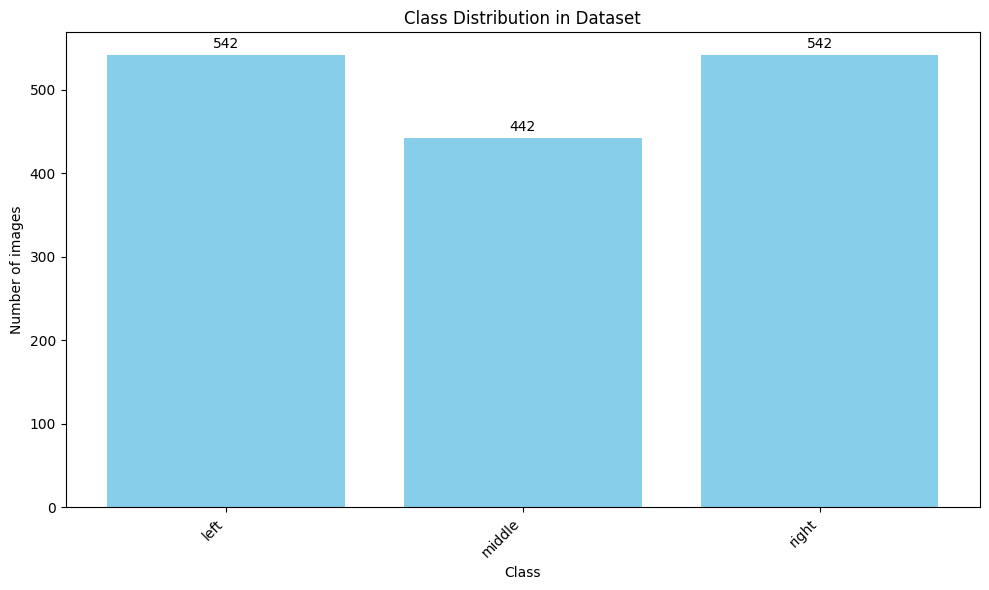

In [ ]:
from torchvision.models import EfficientNet_B4_Weights
from torchvision.models import ResNet18_Weights
# transform = ResNet18_Weights.IMAGENET1K_V1.transforms()

transform = EfficientNet_B4_Weights.IMAGENET1K_V1.transforms()



train_loader, val_loader, test_loader, label_encoder = load_data(transform, shuffle=True, sorted=True)




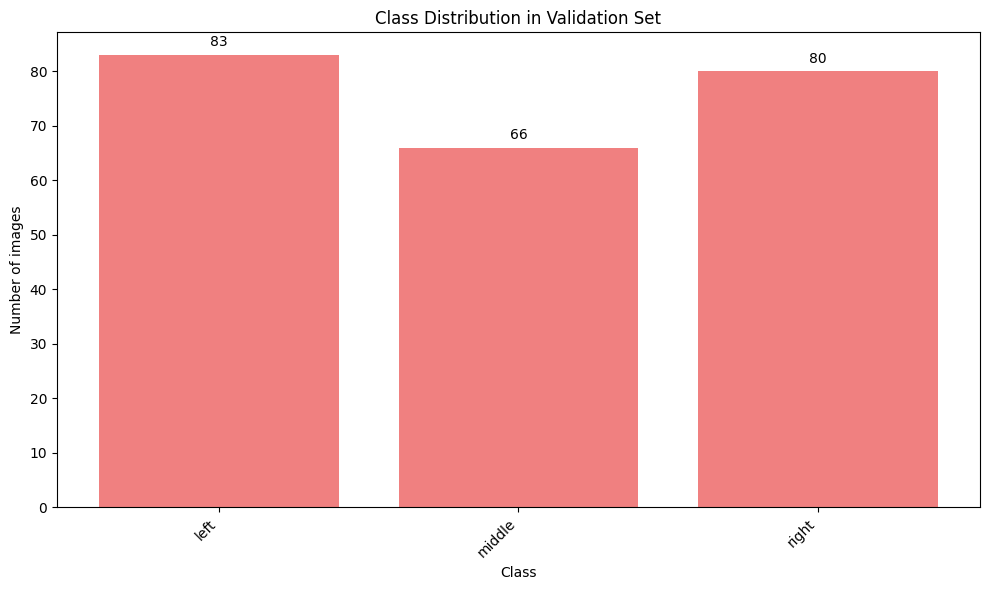

In [ ]:
from collections import Counter
import matplotlib.pyplot as plt

def plot_subset_class_distribution(subset, label_encoder):
    labels = [subset.dataset.encoded_labels[i] for i in subset.indices]
    counter = Counter(labels)
    classes = [label_encoder.classes_[i] for i in counter.keys()]
    counts = list(counter.values())

    plt.figure(figsize=(10, 6))
    bars = plt.bar(classes, counts, color='lightcoral')
    plt.xticks(rotation=45, ha='right')
    plt.xlabel("Class")
    plt.ylabel("Number of images")
    plt.title("Class Distribution in Validation Set")
    plt.tight_layout()

    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2.0, yval + 1, int(yval), ha='center', va='bottom')

    plt.show()

plot_subset_class_distribution(val_loader.dataset, val_loader.dataset.dataset.label_encoder)


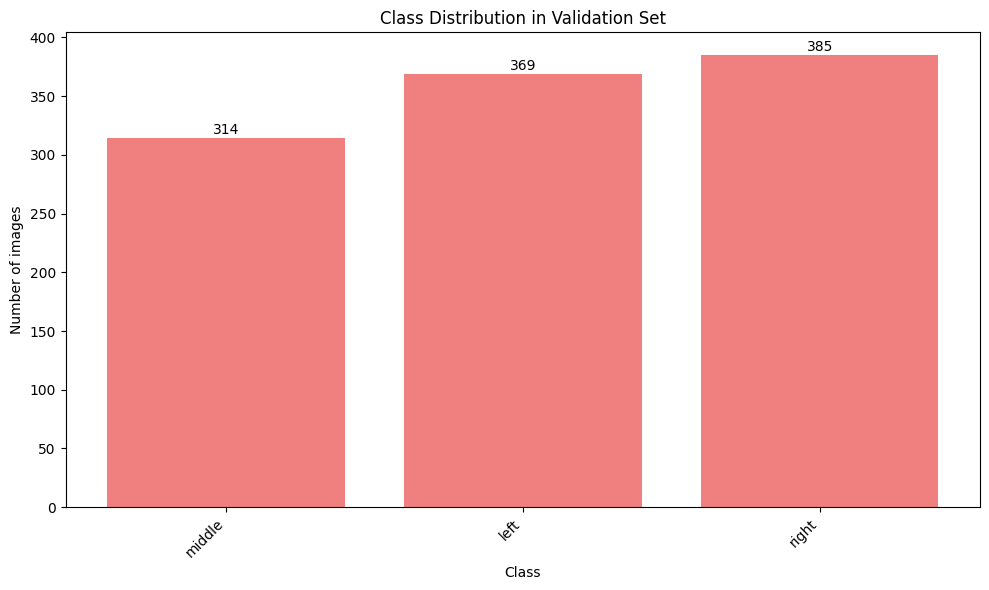

In [ ]:
plot_subset_class_distribution(train_loader.dataset, train_loader.dataset.dataset.label_encoder)


In [ ]:
visualise_images(train_loader)

Image Size: torch.Size([3, 1080, 1920])
Image Size: torch.Size([3, 1080, 1920])
Image Size: torch.Size([3, 1080, 1920])
Image Size: torch.Size([3, 1080, 1920])
Image Size: torch.Size([3, 1080, 1920])
Image Size: torch.Size([3, 1080, 1920])


In [ ]:
visualise_images(train_loader)

Image Size: torch.Size([3, 380, 380])
Image Size: torch.Size([3, 380, 380])
Image Size: torch.Size([3, 380, 380])
Image Size: torch.Size([3, 380, 380])
Image Size: torch.Size([3, 380, 380])
Image Size: torch.Size([3, 380, 380])


In [5]:
def set_seeds(seed: int=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
device = "cuda" if torch.cuda.is_available() else "cpu"
num_classes = 3


In [ ]:
weights_b4 = EfficientNet_B4_Weights.DEFAULT
pretrained_efficient_net_b4 = efficientnet_b4(weights=weights_b4).to(device)

for parameter in pretrained_efficient_net_b4.parameters():
    parameter.requires_grad = False



for parameter in pretrained_efficient_net_b4.features[-1].parameters():
    parameter.requires_grad = True

for m in pretrained_efficient_net_b4.modules():
    if isinstance(m, nn.BatchNorm2d):
        m.requires_grad_(True)



set_seeds()
pretrained_efficient_net_b4.classifier[1] = nn.Linear(in_features=1792, out_features=num_classes).to(device)


Downloading: "https://download.pytorch.org/models/efficientnet_b4_rwightman-23ab8bcd.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b4_rwightman-23ab8bcd.pth
100%|██████████| 74.5M/74.5M [00:00<00:00, 83.8MB/s]


In [35]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class PreActBlock(nn.Module):
    expansion = 1

    def __init__(self, in_planes, planes, stride=1):
        super(PreActBlock, self).__init__()
        self.bn1 = nn.BatchNorm2d(in_planes)
        self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
        self.bn2 = nn.BatchNorm2d(planes)
        self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)

        if stride != 1 or in_planes != self.expansion*planes:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_planes, self.expansion*planes, kernel_size=1, stride=stride, bias=False)
            )
    def forward(self, x):
        out = F.relu(self.bn1(x))
        shortcut = self.shortcut(out) if hasattr(self, 'shortcut') else x
        out = self.conv1(out)
        out = self.conv2(F.relu(self.bn2(out)))
        out += shortcut
        return out


class PreActResNet(nn.Module):
    def __init__(self, block, num_blocks, num_classes=3):
        super(PreActResNet, self).__init__()
        self.in_planes = 64

        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, stride=1, padding=1, bias=False)
        self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
        self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
        self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
        self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
        self.linear = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(512, num_classes)
)

    def _make_layer(self, block, planes, num_blocks, stride):
        strides = [stride] + [1]*(num_blocks-1)
        layers = []
        for stride in strides:
            layers.append(block(self.in_planes, planes, stride))
            self.in_planes = planes * block.expansion
        return nn.Sequential(*layers)

    def forward(self, x):
        out = self.conv1(x)
        out = self.layer1(out)
        out = self.layer2(out)
        out = self.layer3(out)
        out = self.layer4(out)
        out = F.adaptive_avg_pool2d(out, (1,1))
        out = out.view(out.size(0), -1)
        output = self.linear(out)
        return output

def PreActResNet18(num_classes=3):
    return PreActResNet(PreActBlock, [2,2,2,2], num_classes=num_classes)

preact_resnet_model = PreActResNet18()


In [ ]:
from torchvision import datasets, transforms, models
from torchvision.models import ResNet18_Weights

weights_res18 = ResNet18_Weights.DEFAULT
pretrained_resnet18 = models.resnet18(weights=weights_res18).to(device)

for parameter in pretrained_resnet18.parameters():
    parameter.requires_grad = False

for name, param in pretrained_resnet18.named_parameters():
    if 'layer3' in name or 'layer4' in name:
        param.requires_grad = True


for m in pretrained_resnet18.modules():
    if isinstance(m, nn.BatchNorm2d):
        m.requires_grad_(True)

set_seeds()

pretrained_resnet18.fc = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(512, num_classes)
).to(device)


print(pretrained_resnet18)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 106MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
pip install torchinfo


In [ ]:
from torchinfo import summary
summary(model=pretrained_resnet18,
        input_size=(batch_size, 3, 380, 380),
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

Layer (type (var_name))                  Input Shape          Output Shape         Param #              Trainable
ResNet (ResNet)                          [32, 3, 380, 380]    [32, 3]              --                   Partial
├─Conv2d (conv1)                         [32, 3, 380, 380]    [32, 64, 190, 190]   (9,408)              False
├─BatchNorm2d (bn1)                      [32, 64, 190, 190]   [32, 64, 190, 190]   128                  True
├─ReLU (relu)                            [32, 64, 190, 190]   [32, 64, 190, 190]   --                   --
├─MaxPool2d (maxpool)                    [32, 64, 190, 190]   [32, 64, 95, 95]     --                   --
├─Sequential (layer1)                    [32, 64, 95, 95]     [32, 64, 95, 95]     --                   Partial
│    └─BasicBlock (0)                    [32, 64, 95, 95]     [32, 64, 95, 95]     --                   Partial
│    │    └─Conv2d (conv1)               [32, 64, 95, 95]     [32, 64, 95, 95]     (36,864)             False
│    │ 

In [13]:
import torch

from tqdm.auto import tqdm
from torch.optim.lr_scheduler import ReduceLROnPlateau

from typing import Dict, List, Tuple

def train(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               loss_fn: torch.nn.Module,
               optimizer: torch.optim.Optimizer,
               device: torch.device) -> Tuple[float, float]:

    model.train()

    train_loss, train_acc = 0, 0
    y_true, y_pred = [], []
    for batch, (X, y, _) in enumerate(dataloader):
        X, y = X.to(device), y.to(device)

        preds = model(X)
        loss = loss_fn(preds, y)
        train_loss += loss.item()

        optimizer.zero_grad()

        loss.backward()

        optimizer.step()

        y_pred_class = torch.argmax(torch.softmax(preds, dim=1), dim=1)



        train_acc += (y_pred_class == y).sum().item()/len(y_pred_class)

        y_true += y.cpu().numpy().tolist()
        y_pred += y_pred_class.cpu().numpy().tolist()


    cm = confusion_matrix(y_true, y_pred)
    cmp = ConfusionMatrixDisplay(cm, display_labels=np.arange(3))

    train_loss = train_loss / len(dataloader)
    train_acc = train_acc / len(dataloader)
    return train_loss, train_acc, cmp, y_true, y_pred

def validate(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn: torch.nn.Module,
              device: torch.device) -> Tuple[float, float]:

    model.eval()

    test_loss, test_acc = 0, 0
    y_true, y_pred = [], []

    with torch.inference_mode():
        for batch, (X, y, _) in enumerate(dataloader):
            X, y = X.to(device), y.to(device)

            test_pred_logits = model(X)

            loss = loss_fn(test_pred_logits, y)
            test_loss += loss.item()

            test_pred_labels = test_pred_logits.argmax(dim=1)
            test_acc += ((test_pred_labels == y).sum().item()/len(test_pred_labels))

            y_true += y.cpu().numpy().tolist()
            y_pred += test_pred_labels.cpu().numpy().tolist()


    cm = confusion_matrix(y_true, y_pred)
    cmp = ConfusionMatrixDisplay(cm, display_labels=np.arange(3))

    test_loss = test_loss / len(dataloader)
    test_acc = test_acc / len(dataloader)
    return test_loss, test_acc, cmp, y_true, y_pred

def train_and_validate(model: torch.nn.Module,
          train_dataloader: torch.utils.data.DataLoader,
          test_dataloader: torch.utils.data.DataLoader,
          optimizer: torch.optim.Optimizer,
          loss_fn: torch.nn.Module,
          epochs: int,
          device: torch.device) -> Dict[str, List]:

    results = {"train_loss": [],
               "train_acc": [],
               "val_loss": [],
               "val_acc": []
    }

    model.to(device)

    for epoch in tqdm(range(epochs)):
        train_loss, train_acc, train_cmp, train_y_true, train_y_pred = train(model=model,
                                          dataloader=train_dataloader,
                                          loss_fn=loss_fn,
                                          optimizer=optimizer,
                                          device=device)
        val_loss, val_acc, val_cmp, val_y_true, val_y_pred = validate(model=model,
          dataloader=test_dataloader,
          loss_fn=loss_fn,
          device=device)

        print(
          f"Epoch: {epoch+1} | "
          f"train_loss: {train_loss:.4f} | "
          f"train_acc: {train_acc:.4f} | "
          f"val_loss: {val_loss:.4f} | "
          f"val_acc: {val_acc:.4f}"
        )

        results["train_loss"].append(train_loss)
        results["train_acc"].append(train_acc)
        results["val_loss"].append(val_loss)
        results["val_acc"].append(val_acc)

    print("Training results: ", )
    calculate_metrics(train_y_true, train_y_pred)

    print("Validation results: ", )
    calculate_metrics(val_y_true, val_y_pred)


    fig1, ax1 = plt.subplots(figsize=(10,10))
    train_cmp.plot(ax=ax1)

    fig2, ax2 = plt.subplots(figsize=(10,10))
    val_cmp.plot(ax=ax2)

    return results


def predict(
          model: torch.nn.Module,
          dataloader: torch.utils.data.DataLoader,
          device: torch.device):

    model.eval()
    all_logits = []

    with torch.inference_mode():
        for batch, (X, _, _) in enumerate(dataloader):
            X = X.to(device)
            logits = model(X)
            all_logits.append(logits.cpu())

    return torch.cat(all_logits, dim=0)


In [11]:
def calculate_metrics(y_test, y_pred):
  accuracy = accuracy_score(y_test, y_pred)
  precision = precision_score(y_test, y_pred, average='weighted')
  recall = recall_score(y_test, y_pred, average='weighted')
  f1_score_res = f1_score(y_test, y_pred, average='weighted')

  print("Accuracy:", accuracy)
  print("Precision:", precision)
  print("Recall:", recall)
  print("F1 score:", f1_score_res)

In [12]:
# Plot loss curves of a model
def plot_loss_curves(results):
    loss = results["train_loss"]
    val_loss = results["val_loss"]

    accuracy = results["train_acc"]
    val_accuracy = results["val_acc"]

    epochs = range(len(results["train_loss"]))

    plt.figure(figsize=(15, 7))

    # Plot loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label="train_loss")
    plt.plot(epochs, val_loss, label="test_loss")
    plt.title("Loss")
    plt.xlabel("Epochs")
    plt.legend()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label="train_accuracy")
    plt.plot(epochs, val_accuracy, label="test_accuracy")
    plt.title("Accuracy")
    plt.xlabel("Epochs")
    plt.legend()

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0596 | train_acc: 0.4755 | val_loss: 1.0094 | val_acc: 0.6492
Epoch: 2 | train_loss: 0.9785 | train_acc: 0.6039 | val_loss: 0.9366 | val_acc: 0.6859
Epoch: 3 | train_loss: 0.9180 | train_acc: 0.6694 | val_loss: 0.8800 | val_acc: 0.7055
Epoch: 4 | train_loss: 0.8666 | train_acc: 0.6863 | val_loss: 0.8408 | val_acc: 0.6898
Epoch: 5 | train_loss: 0.8263 | train_acc: 0.7062 | val_loss: 0.7984 | val_acc: 0.7172
Epoch: 6 | train_loss: 0.7989 | train_acc: 0.7062 | val_loss: 0.7685 | val_acc: 0.7289
Epoch: 7 | train_loss: 0.7808 | train_acc: 0.7230 | val_loss: 0.7501 | val_acc: 0.7328
Epoch: 8 | train_loss: 0.7564 | train_acc: 0.7258 | val_loss: 0.7242 | val_acc: 0.7484
Epoch: 9 | train_loss: 0.7361 | train_acc: 0.7350 | val_loss: 0.7132 | val_acc: 0.7523
Epoch: 10 | train_loss: 0.7089 | train_acc: 0.7479 | val_loss: 0.6842 | val_acc: 0.7758
Epoch: 11 | train_loss: 0.7036 | train_acc: 0.7420 | val_loss: 0.6796 | val_acc: 0.7641
Epoch: 12 | train_loss: 0.6858 | train_ac

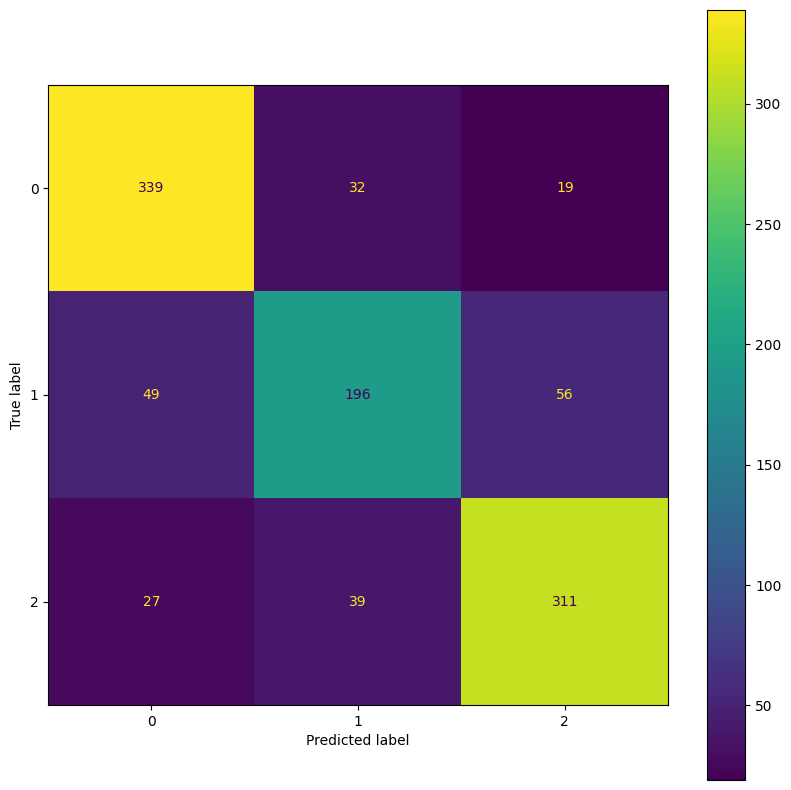

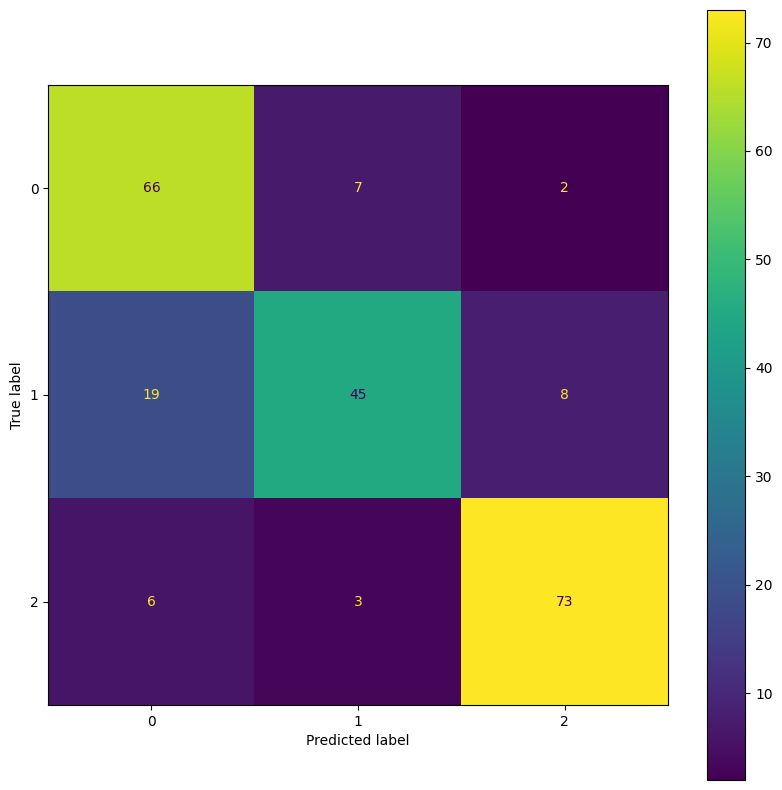

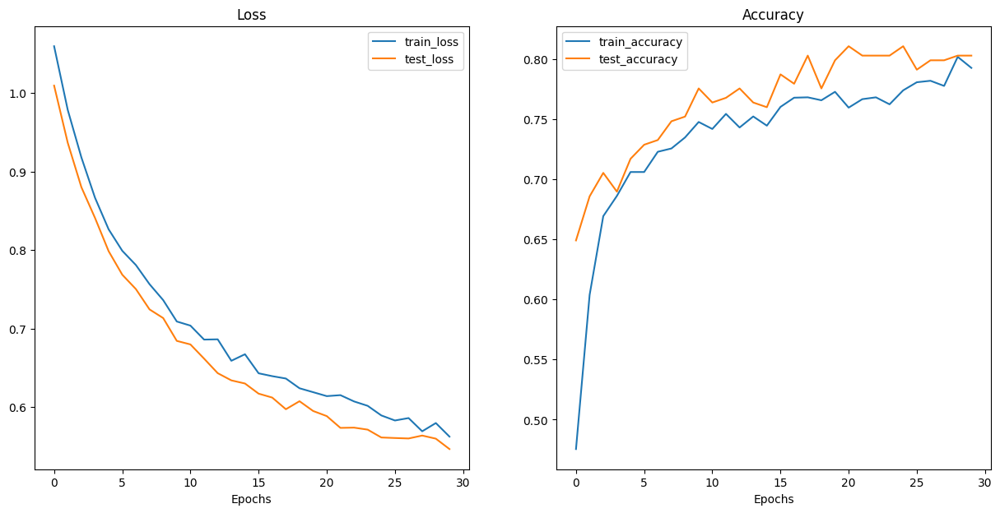

In [ ]:
optimizer = torch.optim.Adam(params=pretrained_efficient_net_b4.parameters(),
                             lr=1e-3)
loss_fn = torch.nn.CrossEntropyLoss()

set_seeds()


efficient_net_result = train_and_validate(model=pretrained_efficient_net_b4,
                                      train_dataloader=train_loader,
                                      test_dataloader=test_loader,
                                      optimizer=optimizer,
                                      loss_fn=loss_fn,
                                      epochs=30,
                                      device=device)


plot_loss_curves(efficient_net_result)

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0596 | train_acc: 0.4755 | val_loss: 1.0094 | val_acc: 0.6492
Epoch: 2 | train_loss: 0.9785 | train_acc: 0.6039 | val_loss: 0.9366 | val_acc: 0.6859
Epoch: 3 | train_loss: 0.9180 | train_acc: 0.6694 | val_loss: 0.8800 | val_acc: 0.7055
Epoch: 4 | train_loss: 0.8666 | train_acc: 0.6863 | val_loss: 0.8408 | val_acc: 0.6898
Epoch: 5 | train_loss: 0.8263 | train_acc: 0.7062 | val_loss: 0.7984 | val_acc: 0.7172
Epoch: 6 | train_loss: 0.7989 | train_acc: 0.7062 | val_loss: 0.7685 | val_acc: 0.7289
Epoch: 7 | train_loss: 0.7808 | train_acc: 0.7230 | val_loss: 0.7501 | val_acc: 0.7328
Epoch: 8 | train_loss: 0.7564 | train_acc: 0.7258 | val_loss: 0.7242 | val_acc: 0.7484
Epoch: 9 | train_loss: 0.7361 | train_acc: 0.7350 | val_loss: 0.7132 | val_acc: 0.7523
Epoch: 10 | train_loss: 0.7089 | train_acc: 0.7479 | val_loss: 0.6842 | val_acc: 0.7758
Epoch: 11 | train_loss: 0.7036 | train_acc: 0.7420 | val_loss: 0.6796 | val_acc: 0.7641
Epoch: 12 | train_loss: 0.6858 | train_ac

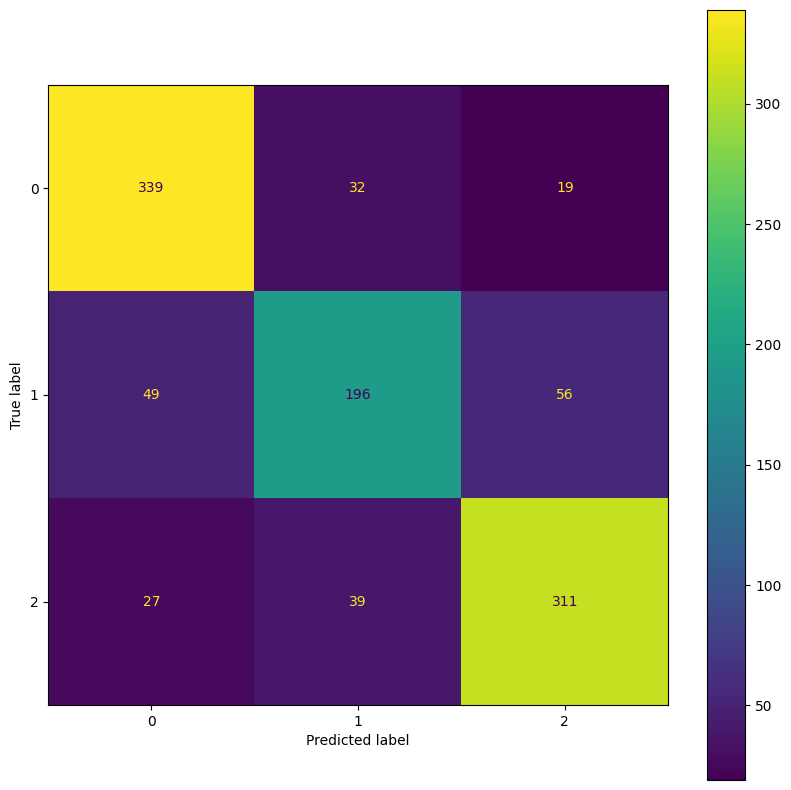

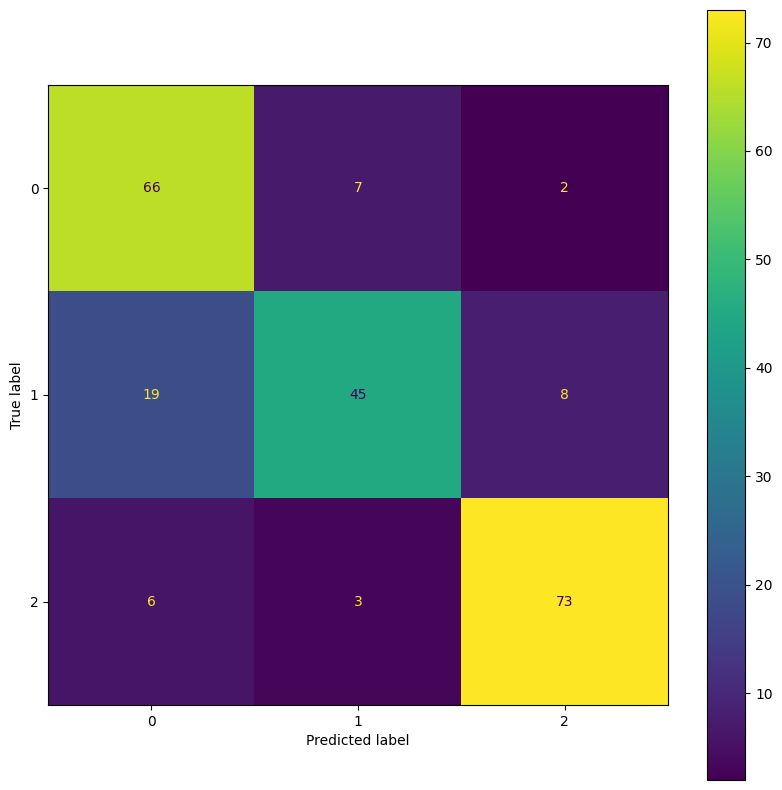

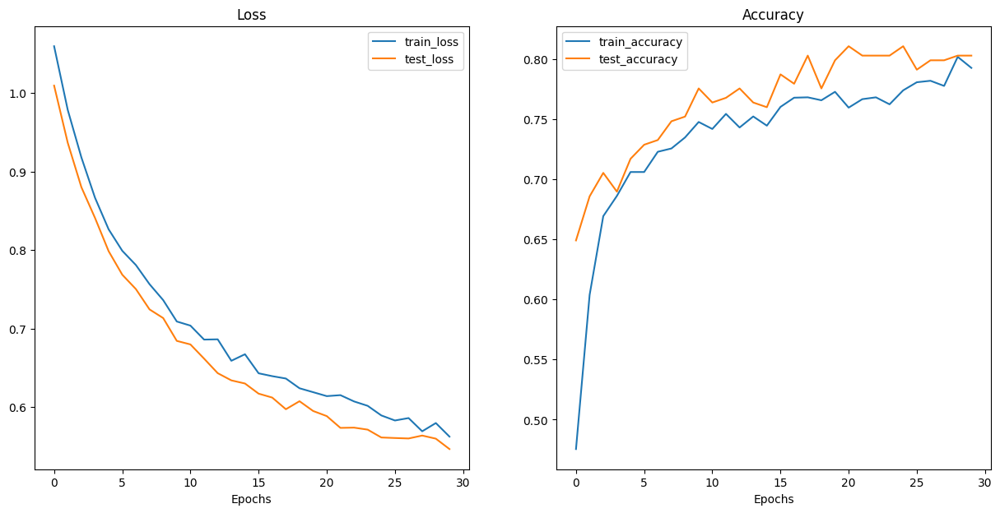

In [ ]:
# optimizer = torch.optim.Adam(params=pretrained_efficient_net_b4.parameters(),
#                              lr=1e-3)
# loss_fn = torch.nn.CrossEntropyLoss()

# set_seeds()


# efficient_net_result = train_and_validate(model=pretrained_efficient_net_b4,
#                                       train_dataloader=train_loader,
#                                       test_dataloader=test_loader,
#                                       optimizer=optimizer,
#                                       loss_fn=loss_fn,
#                                       epochs=30,
#                                       device=device)


# plot_loss_curves(efficient_net_result)

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0616 | train_acc: 0.4724 | val_loss: 0.9951 | val_acc: 0.6570
Epoch: 2 | train_loss: 0.9829 | train_acc: 0.6229 | val_loss: 0.9165 | val_acc: 0.7172
Epoch: 3 | train_loss: 0.9247 | train_acc: 0.6679 | val_loss: 0.8645 | val_acc: 0.7055
Epoch: 4 | train_loss: 0.8753 | train_acc: 0.7117 | val_loss: 0.8198 | val_acc: 0.7250
Epoch: 5 | train_loss: 0.8331 | train_acc: 0.7188 | val_loss: 0.7795 | val_acc: 0.7328
Epoch: 6 | train_loss: 0.8093 | train_acc: 0.7053 | val_loss: 0.7478 | val_acc: 0.7211
Epoch: 7 | train_loss: 0.7928 | train_acc: 0.7037 | val_loss: 0.7273 | val_acc: 0.7406
Epoch: 8 | train_loss: 0.7563 | train_acc: 0.7282 | val_loss: 0.7109 | val_acc: 0.7328
Epoch: 9 | train_loss: 0.7322 | train_acc: 0.7436 | val_loss: 0.6879 | val_acc: 0.7289
Epoch: 10 | train_loss: 0.7259 | train_acc: 0.7331 | val_loss: 0.6702 | val_acc: 0.7250
Epoch: 11 | train_loss: 0.7112 | train_acc: 0.7325 | val_loss: 0.6587 | val_acc: 0.7406
Epoch: 12 | train_loss: 0.6912 | train_ac

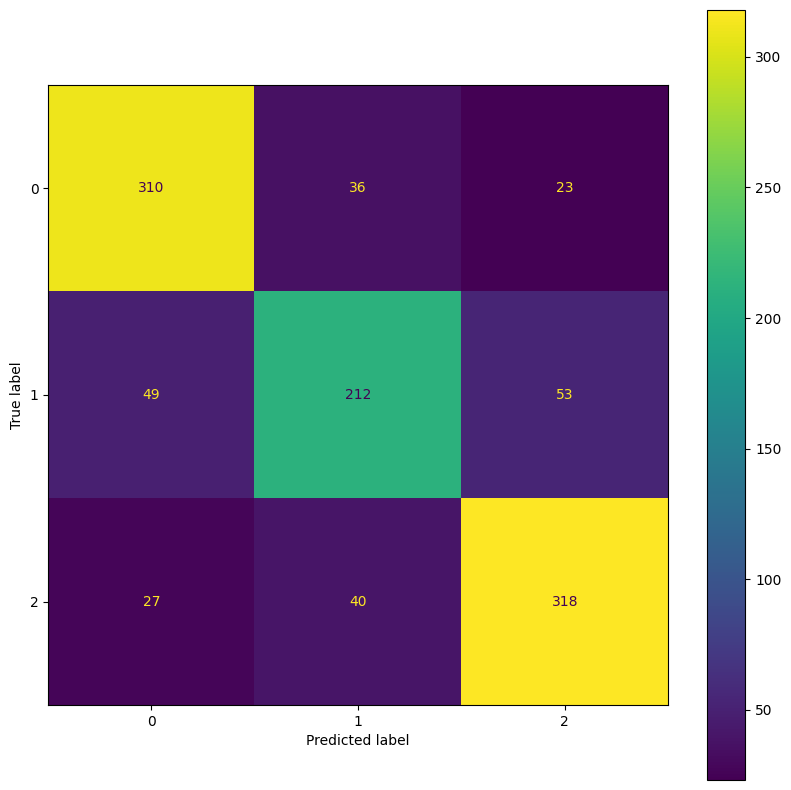

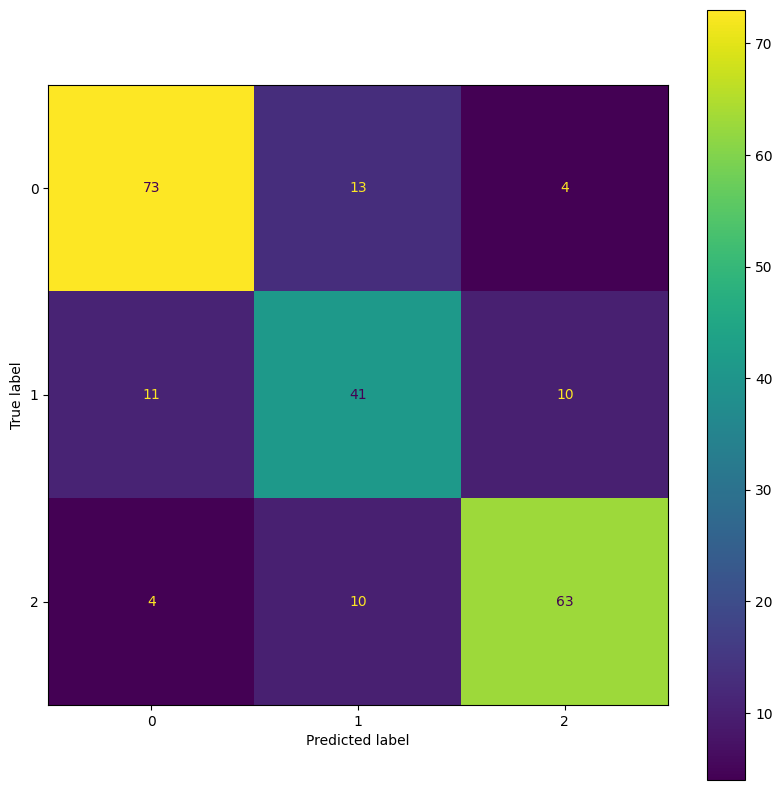

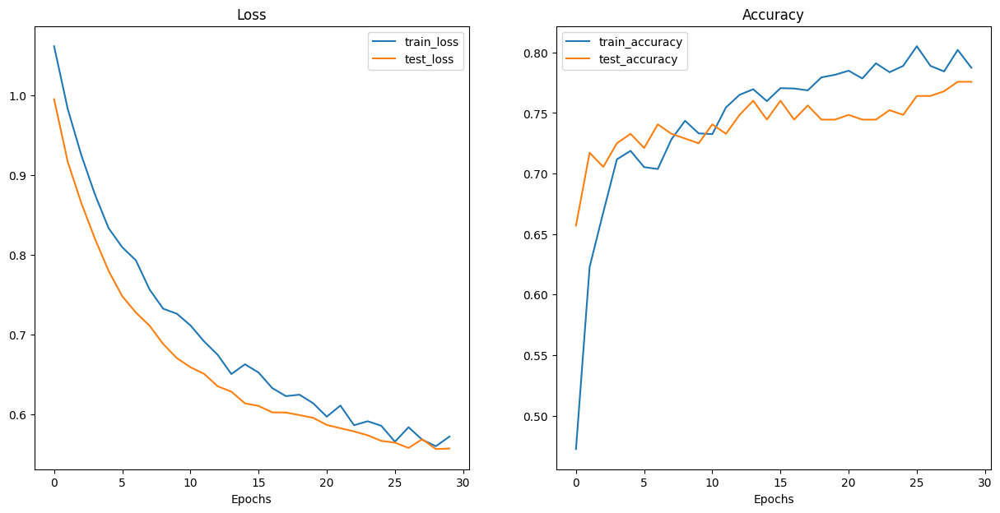

In [ ]:
# optimizer = torch.optim.Adam(params=pretrained_efficient_net_b4.parameters(),
#                              lr=1e-3)
# loss_fn = torch.nn.CrossEntropyLoss()

# set_seeds()
# efficient_net_result = train_and_validate(model=pretrained_efficient_net_b4,
#                                       train_dataloader=train_loader,
#                                       test_dataloader=test_loader,
#                                       optimizer=optimizer,
#                                       loss_fn=loss_fn,
#                                       epochs=30,
#                                       device=device)


# plot_loss_curves(efficient_net_result)

/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


  0%|          | 0/40 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.2295 | train_acc: 0.3461 | val_loss: 2.0635 | val_acc: 0.4474
Epoch: 2 | train_loss: 1.0920 | train_acc: 0.4440 | val_loss: 1.4935 | val_acc: 0.2940
Epoch: 3 | train_loss: 0.9425 | train_acc: 0.5541 | val_loss: 0.8656 | val_acc: 0.6828
Epoch: 4 | train_loss: 0.9091 | train_acc: 0.5849 | val_loss: 0.6876 | val_acc: 0.7302
Epoch: 5 | train_loss: 0.8325 | train_acc: 0.6343 | val_loss: 0.9590 | val_acc: 0.6500
Epoch: 6 | train_loss: 0.8064 | train_acc: 0.6315 | val_loss: 1.5635 | val_acc: 0.5310
Epoch: 7 | train_loss: 0.8269 | train_acc: 0.6399 | val_loss: 0.9017 | val_acc: 0.6483
Epoch: 8 | train_loss: 0.7863 | train_acc: 0.6604 | val_loss: 0.6376 | val_acc: 0.7388
Epoch: 9 | train_loss: 0.7557 | train_acc: 0.6642 | val_loss: 0.8113 | val_acc: 0.7172
Epoch: 10 | train_loss: 0.8562 | train_acc: 0.6259 | val_loss: 0.8097 | val_acc: 0.6828
Epoch: 11 | train_loss: 0.7411 | train_acc: 0.6688 | val_loss: 1.1575 | val_acc: 0.4905
Epoch: 12 | train_loss: 0.7974 | train_ac

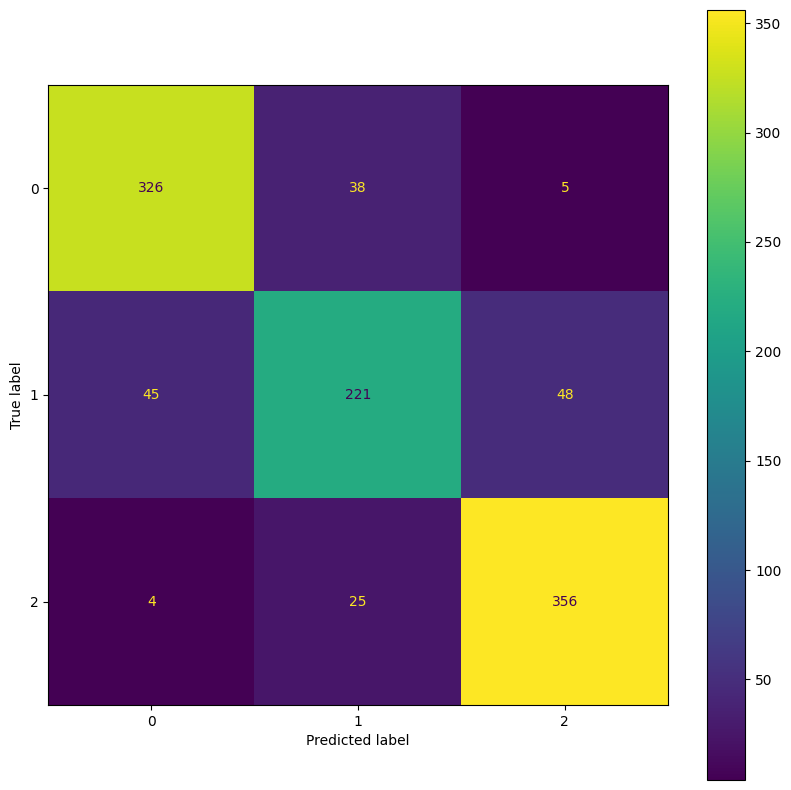

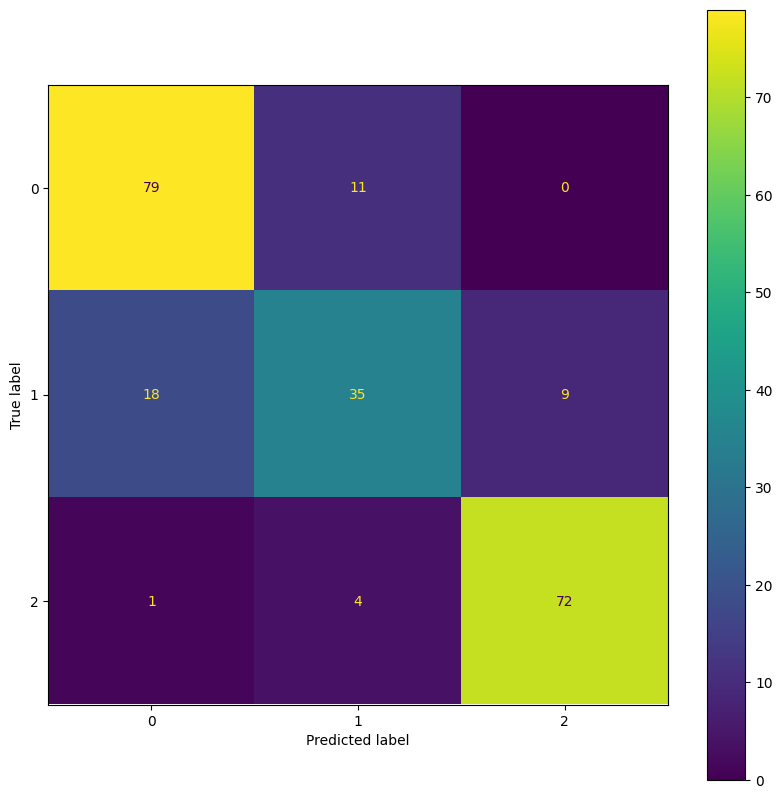

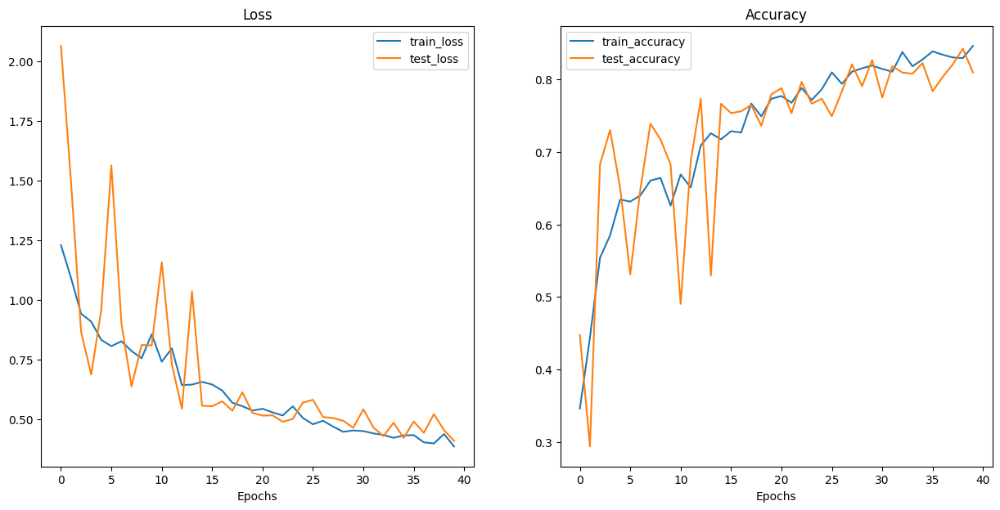

In [ ]:
optimizer = torch.optim.Adam(params=preact_resnet_model.parameters(),
                             lr=1e-4) #new
loss_fn = torch.nn.CrossEntropyLoss()
# loss_fn = nn.CrossEntropyLoss(label_smoothing=0.1)

set_seeds()
resnet_result = train_and_validate(model=preact_resnet_model,
                                      train_dataloader=train_loader,
                                      test_dataloader=test_loader,
                                      optimizer=optimizer,
                                      loss_fn=loss_fn,
                                      epochs=40,
                                      device=device)


plot_loss_curves(resnet_result)

  0%|          | 0/30 [00:00<?, ?it/s]

Epoch: 1 | train_loss: 1.0351 | train_acc: 0.4776 | val_loss: 4.1439 | val_acc: 0.3974
Epoch: 2 | train_loss: 0.9035 | train_acc: 0.5924 | val_loss: 0.5744 | val_acc: 0.7431
Epoch: 3 | train_loss: 0.7372 | train_acc: 0.6716 | val_loss: 0.5702 | val_acc: 0.7664
Epoch: 4 | train_loss: 0.7124 | train_acc: 0.6894 | val_loss: 0.6332 | val_acc: 0.7474
Epoch: 5 | train_loss: 0.6386 | train_acc: 0.7388 | val_loss: 1.4026 | val_acc: 0.5353
Epoch: 6 | train_loss: 0.5933 | train_acc: 0.7500 | val_loss: 0.4881 | val_acc: 0.7991
Epoch: 7 | train_loss: 0.5203 | train_acc: 0.7901 | val_loss: 0.7918 | val_acc: 0.7345
Epoch: 8 | train_loss: 0.5203 | train_acc: 0.7966 | val_loss: 0.8535 | val_acc: 0.7733
Epoch: 9 | train_loss: 0.5047 | train_acc: 0.8097 | val_loss: 0.5013 | val_acc: 0.7690
Epoch: 10 | train_loss: 0.4708 | train_acc: 0.8218 | val_loss: 0.3313 | val_acc: 0.8724
Epoch: 11 | train_loss: 0.4280 | train_acc: 0.8368 | val_loss: 0.3964 | val_acc: 0.8655
Epoch: 12 | train_loss: 0.4104 | train_ac

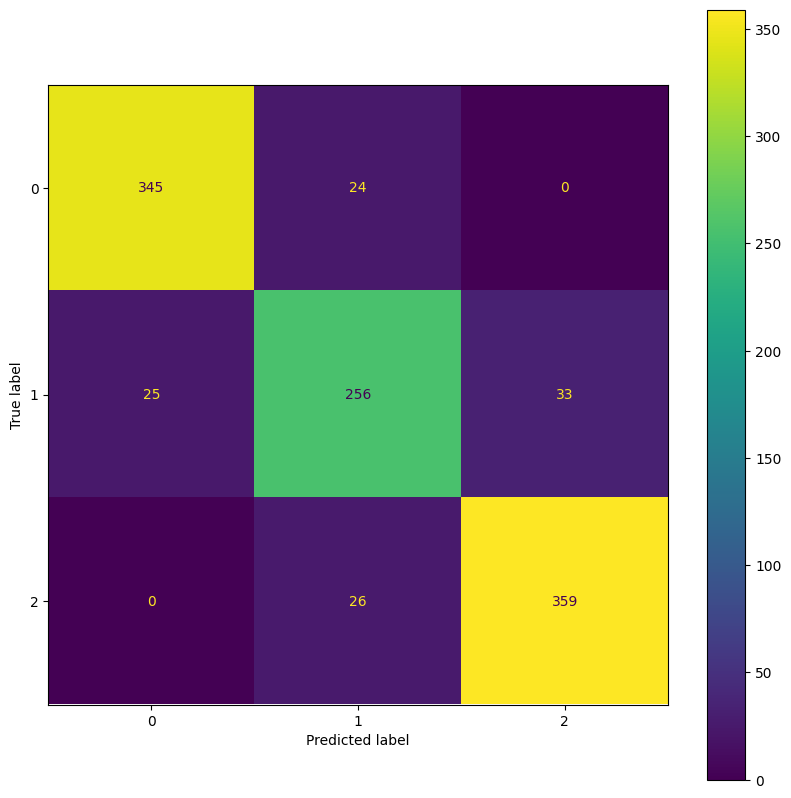

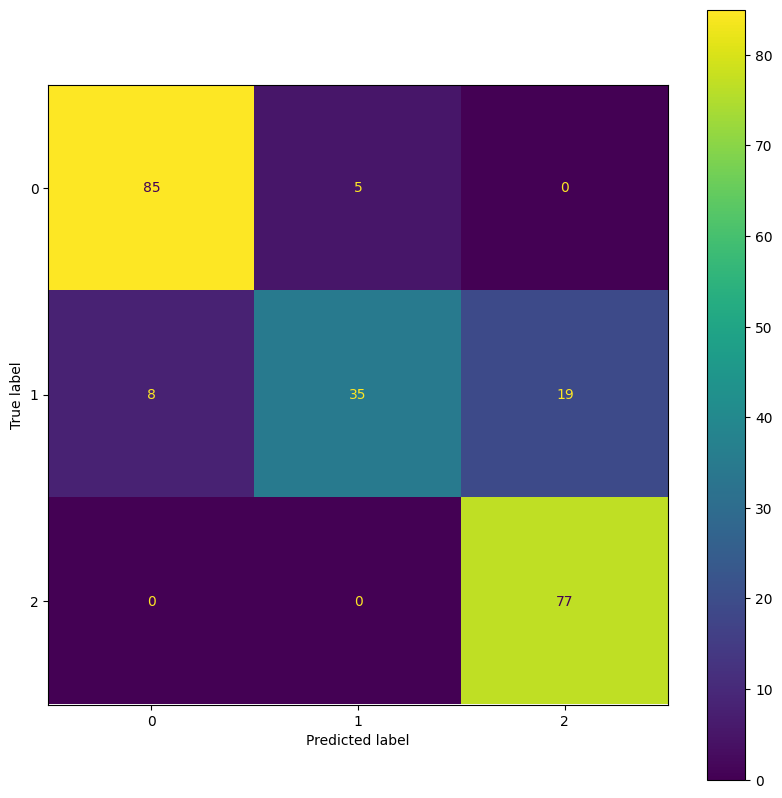

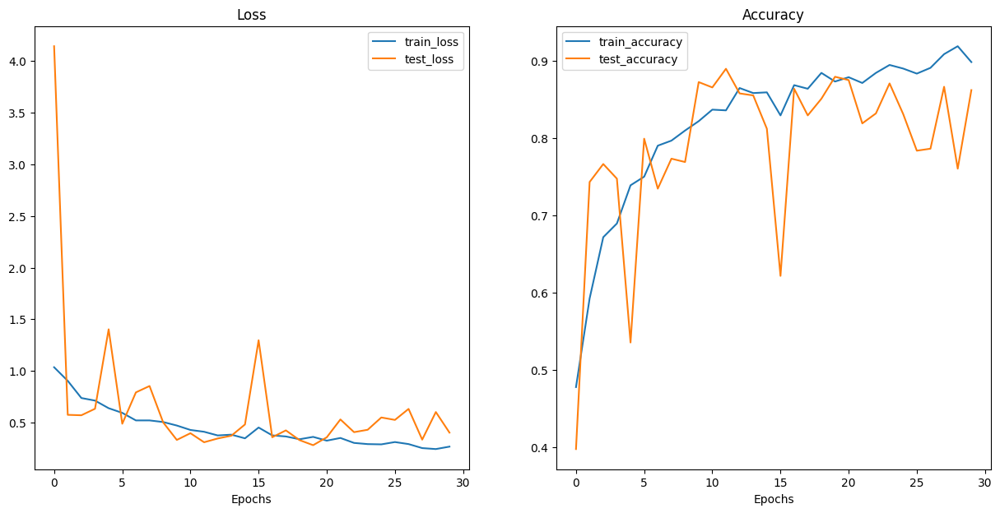

In [ ]:
optimizer = torch.optim.Adam(params=preact_resnet_model.parameters(),
                             lr=1e-4)
loss_fn = torch.nn.CrossEntropyLoss()

set_seeds()
resnet_result = train_and_validate(model=preact_resnet_model,
                                      train_dataloader=train_loader,
                                      test_dataloader=test_loader,
                                      optimizer=optimizer,
                                      loss_fn=loss_fn,
                                      epochs=30,
                                      device=device)


plot_loss_curves(resnet_result)

In [ ]:
from google.colab import files
torch.save(preact_resnet_model.state_dict(), "preact_resnet18_finetuned.pth")


In [ ]:
files.download("preact_resnet18_finetuned.pth")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [6]:
from torchvision.models import efficientnet_b4, EfficientNet_B4_Weights
import torch.nn as nn
import torch

num_classes = 3

weights_b4 = EfficientNet_B4_Weights.DEFAULT
pretrained_efficient_net_b4 = efficientnet_b4(weights=weights_b4).to(device)

pretrained_efficient_net_b4.classifier[1] = nn.Linear(in_features=1792, out_features=num_classes).to(device)

pretrained_efficient_net_b4.load_state_dict(torch.load("drive/MyDrive/ski_pose_classifier/efficientnet_b4_finetuned.pth"))

for param in pretrained_efficient_net_b4.parameters():
    param.requires_grad = True

pretrained_efficient_net_b4.to(device)
pretrained_efficient_net_b4.eval()

Downloading: "https://download.pytorch.org/models/efficientnet_b4_rwightman-23ab8bcd.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b4_rwightman-23ab8bcd.pth
100%|██████████| 74.5M/74.5M [00:00<00:00, 100MB/s]


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
            (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(12, 48, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActiv

In [36]:
preact_resnet_model = PreActResNet18()

state_dict = torch.load("drive/MyDrive/ski_pose_classifier/preact_resnet18_finetuned.pth")
preact_resnet_model.load_state_dict(state_dict)
preact_resnet_model.to(device)

preact_resnet_model.eval()

PreActResNet(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (layer1): Sequential(
    (0): PreActBlock(
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
    (1): PreActBlock(
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    )
  )
  (layer2): Sequential(
    (0): PreActBlock(
      (bn1): BatchNorm2d

sorted
Label mapping:
0: left
1: middle
2: right


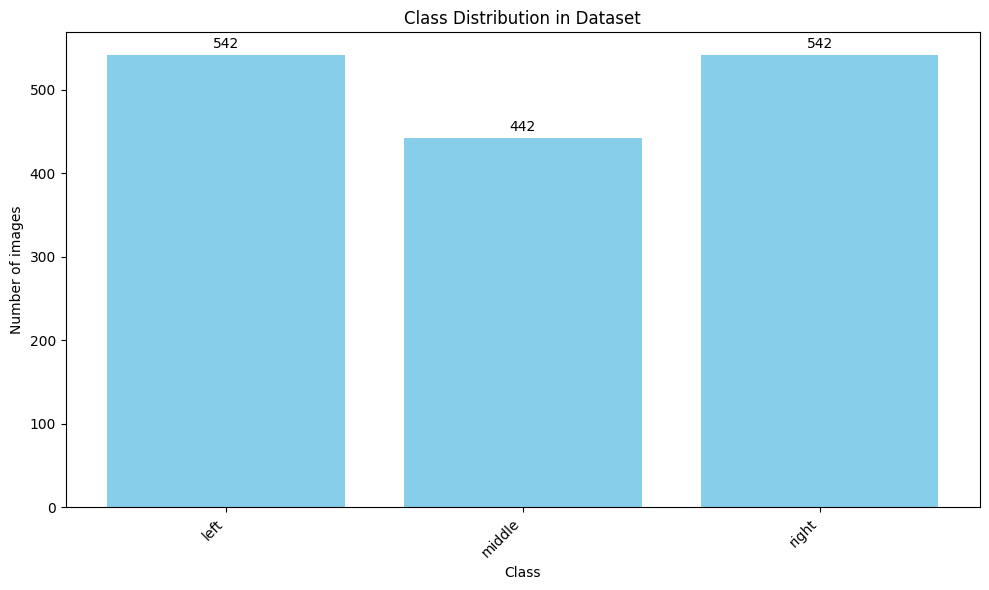

In [38]:
from torchvision.models import EfficientNet_B4_Weights, ResNet18_Weights
# transform = EfficientNet_B4_Weights.IMAGENET1K_V1.transforms()
transform = ResNet18_Weights.IMAGENET1K_V1.transforms()


train_loader, val_loader, test_loader, label_encoder = load_data(transform, shuffle=False, sorted=True)

In [39]:
# logits_train = predict(pretrained_efficient_net_b4, train_loader, device)
logits_train = predict(preact_resnet_model, train_loader, device)





In [40]:
y_train = []
img_names_train = []

for _, labels, names in train_loader:
    y_train.extend(labels.numpy())
    img_names_train.extend(names)

In [41]:
# logits_val = predict(pretrained_efficient_net_b4, val_loader, device)
logits_val = predict(preact_resnet_model, val_loader, device)


y_val = []
img_names_val = []

for _, labels, names in val_loader:
    y_val.extend(labels.numpy())
    img_names_val.extend(names)


In [42]:
# logits_test = predict(pretrained_efficient_net_b4, test_loader, device)
logits_test = predict(preact_resnet_model, test_loader, device)


y_test = []
img_names_test = []

for _, labels, names in test_loader:
    y_test.extend(labels.numpy())
    img_names_test.extend(names)

In [ ]:
plot_subset_class_distribution(train_loader.dataset, train_loader.dataset.dataset.label_encoder)

NameError: name 'plot_subset_class_distribution' is not defined

In [43]:
def create_lstm_dataset(logits, labels, img_names, lookback):
    X, y = [], []
    target_img_names = []
    for i in range(len(logits) - lookback):
        inputs = logits[i : i + lookback]
        target = labels[i + lookback - 1]
        target_img_names.append(img_names[i + lookback])
        X.append(inputs)
        y.append(target)

    X = np.array(X, dtype=np.float32)
    y = np.array(y, dtype=np.float32)

    return torch.tensor(X), torch.tensor(y), target_img_names


In [44]:
features, targets, target_img_names = create_lstm_dataset(logits_train, y_train, img_names_train, lookback=10)

print("LSTM Input shape:", features.shape)
print("LSTM Target shape:", targets.shape)

LSTM Input shape: torch.Size([1058, 10, 3])
LSTM Target shape: torch.Size([1058])


In [45]:
features_val, targets_val, target_img_names_val = create_lstm_dataset(logits_val, y_val, img_names_val, lookback=10)

print("LSTM Input shape:", features_val.shape)
print("LSTM Target shape:", targets_val.shape)

LSTM Input shape: torch.Size([219, 10, 3])
LSTM Target shape: torch.Size([219])


In [46]:
features_test, targets_test, target_img_names_test = create_lstm_dataset(logits_test, y_test, img_names_test, lookback=10)

print("LSTM Input shape:", features_test.shape)
print("LSTM Target shape:", targets_test.shape)

LSTM Input shape: torch.Size([219, 10, 3])
LSTM Target shape: torch.Size([219])


In [47]:
X_train = features
y_train = targets
X_val = features_val
y_val = targets_val

X_test = features_test
y_test = targets_test


In [48]:
import torch.nn as nn

class LSTMClassifier(nn.Module):
    def __init__(self, input_dim=3, hidden_dim=128, num_layers=1, output_dim=3, batch_size=8):
        super(LSTMClassifier, self).__init__()
        self.input_dim = input_dim
        self.output_dim = output_dim
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.batch_size = batch_size

        self.lstm = nn.LSTM(input_size= self.input_dim ,hidden_size=self.hidden_dim,
                           num_layers=self.num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
        self.dropout = nn.Dropout(0.3)

    def forward(self, x):
        batch_size = x.size(0)
        hidden = self.init_hidden(batch_size)
        lstm_out, hidden = self.lstm(x, hidden)
        lstm_out = lstm_out[:, -1, :]
        lstm_out = self.dropout(lstm_out)
        out = self.fc(lstm_out)

        return out
    def init_hidden(self, batch_size):
        h0 = torch.zeros((self.num_layers,batch_size,self.hidden_dim)).to(device)
        c0 = torch.zeros((self.num_layers,batch_size,self.hidden_dim)).to(device)
        hidden = (h0,c0)
        return hidden




In [49]:
batch_size = 32
train_loader = DataLoader(data.TensorDataset(X_train, y_train), shuffle=False, batch_size=batch_size, drop_last=True)
val_loader = DataLoader(data.TensorDataset(X_val, y_val), shuffle=False, batch_size=batch_size, drop_last=True)
test_loader = DataLoader(data.TensorDataset(X_test, y_test), shuffle=False, batch_size=batch_size, drop_last=True)

In [50]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

def train_and_validate_lstm():
    model = LSTMClassifier(batch_size=8)
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

    epochs = 40

    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []

    train_y_true, train_y_pred = [], []
    val_y_true, val_y_pred = [], []

    for epoch in range(epochs):
        model.train()
        total_train_loss = 0
        train_correct, train_total = 0, 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device).float(), labels.to(device).long()
            optimizer.zero_grad()
            preds = model(inputs)
            loss = criterion(preds, labels)
            loss.backward()
            optimizer.step()

            total_train_loss += loss.item()
            pred_classes = preds.argmax(dim=1)

            train_correct += (pred_classes == labels).sum().item()
            train_total += labels.numel()
            if epoch == epochs - 1:
              train_y_true += labels.cpu().numpy().tolist()
              train_y_pred += pred_classes.cpu().numpy().tolist()

            # train_y_true += labels.cpu().numpy().tolist()
            # train_y_pred += pred_classes.cpu().numpy().tolist()

        train_loss = total_train_loss / len(train_loader)
        train_accuracy = train_correct / train_total
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)

        model.eval()
        total_val_loss = 0
        val_correct, val_total = 0, 0

        with torch.no_grad():
            for val_data in val_loader:
                inputs, val_labels = val_data[0], val_data[1]
                inputs, val_labels = inputs.to(device).float(), val_labels.to(device).long()

                val_preds = model(inputs)
                val_loss = criterion(val_preds, val_labels)
                total_val_loss += val_loss.item()

                pred_classes = val_preds.argmax(dim=1)
                val_correct += (pred_classes == val_labels).sum().item()
                val_total += val_labels.numel()
                if epoch == epochs - 1:
                  val_y_true += val_labels.cpu().numpy().tolist()
                  val_y_pred += pred_classes.cpu().numpy().tolist()

        val_loss = total_val_loss / len(val_loader)
        val_accuracy = val_correct / val_total
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        print(f"Epoch {epoch+1}/{epochs}")
        print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy*100:.2f}%")
        print(f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy*100:.2f}%")
        print("=" * 40)

    print("Training results:")
    calculate_metrics(train_y_true, train_y_pred)

    print("Validation results:")
    calculate_metrics(val_y_true, val_y_pred)

    cm_train = confusion_matrix(train_y_true, train_y_pred)
    cm_val = confusion_matrix(val_y_true, val_y_pred)

    fig1, ax1 = plt.subplots(figsize=(8, 8))
    ConfusionMatrixDisplay(confusion_matrix=cm_train).plot(ax=ax1)
    ax1.set_title("Confusion Matrix - Train")

    fig2, ax2 = plt.subplots(figsize=(8, 8))
    ConfusionMatrixDisplay(confusion_matrix=cm_val).plot(ax=ax2)
    ax2.set_title("Confusion Matrix - Validation")

    return model, train_losses, val_losses, train_accuracies, val_accuracies


In [ ]:
# train_and_validate_lstm()

Epoch 1/100
Train Loss: 0.0336, Train Accuracy: 43.84%
Val Loss: 0.0389, Val Accuracy: 0.00%
Epoch 2/100
Train Loss: 0.0318, Train Accuracy: 57.67%
Val Loss: 0.0407, Val Accuracy: 0.00%
Epoch 3/100
Train Loss: 0.0303, Train Accuracy: 61.55%
Val Loss: 0.0425, Val Accuracy: 0.00%
Epoch 4/100
Train Loss: 0.0286, Train Accuracy: 63.54%
Val Loss: 0.0447, Val Accuracy: 0.00%
Epoch 5/100
Train Loss: 0.0261, Train Accuracy: 66.76%
Val Loss: 0.0472, Val Accuracy: 0.00%
Epoch 6/100
Train Loss: 0.0221, Train Accuracy: 72.25%
Val Loss: 0.0490, Val Accuracy: 0.00%
Epoch 7/100
Train Loss: 0.0166, Train Accuracy: 86.55%
Val Loss: 0.0494, Val Accuracy: 0.00%
Epoch 8/100
Train Loss: 0.0123, Train Accuracy: 90.81%
Val Loss: 0.0528, Val Accuracy: 0.00%
Epoch 9/100
Train Loss: 0.0100, Train Accuracy: 90.72%
Val Loss: 0.0571, Val Accuracy: 0.00%
Epoch 10/100
Train Loss: 0.0089, Train Accuracy: 90.72%
Val Loss: 0.0571, Val Accuracy: 0.00%
Epoch 11/100
Train Loss: 0.0082, Train Accuracy: 90.72%
Val Loss: 0.0

In [ ]:
# train_and_validate_lstm()

Epoch 1/100
Train Loss: 0.0348, Train Accuracy: 21.69%
Val Loss: 0.0347, Val Accuracy: 0.00%
Epoch 2/100
Train Loss: 0.0329, Train Accuracy: 50.09%
Val Loss: 0.0339, Val Accuracy: 7.99%
Epoch 3/100
Train Loss: 0.0313, Train Accuracy: 56.91%
Val Loss: 0.0331, Val Accuracy: 27.43%
Epoch 4/100
Train Loss: 0.0294, Train Accuracy: 61.08%
Val Loss: 0.0322, Val Accuracy: 40.62%
Epoch 5/100
Train Loss: 0.0269, Train Accuracy: 64.39%
Val Loss: 0.0311, Val Accuracy: 51.04%
Epoch 6/100
Train Loss: 0.0229, Train Accuracy: 70.45%
Val Loss: 0.0289, Val Accuracy: 71.18%
Epoch 7/100
Train Loss: 0.0174, Train Accuracy: 84.56%
Val Loss: 0.0236, Val Accuracy: 80.56%
Epoch 8/100
Train Loss: 0.0125, Train Accuracy: 90.91%
Val Loss: 0.0180, Val Accuracy: 81.60%
Epoch 9/100
Train Loss: 0.0098, Train Accuracy: 90.91%
Val Loss: 0.0154, Val Accuracy: 81.60%
Epoch 10/100
Train Loss: 0.0085, Train Accuracy: 90.53%
Val Loss: 0.0140, Val Accuracy: 81.60%
Epoch 11/100
Train Loss: 0.0078, Train Accuracy: 90.62%
Val L

In [ ]:
# train_and_validate_lstm() # val 0.222

Epoch 1/100
Train Loss: 0.0345, Train Accuracy: 33.62%
Val Loss: 0.0341, Val Accuracy: 32.64%
Epoch 2/100
Train Loss: 0.0331, Train Accuracy: 42.33%
Val Loss: 0.0328, Val Accuracy: 39.93%
Epoch 3/100
Train Loss: 0.0317, Train Accuracy: 56.82%
Val Loss: 0.0313, Val Accuracy: 59.72%
Epoch 4/100
Train Loss: 0.0299, Train Accuracy: 64.02%
Val Loss: 0.0295, Val Accuracy: 64.24%
Epoch 5/100
Train Loss: 0.0279, Train Accuracy: 64.30%
Val Loss: 0.0275, Val Accuracy: 61.81%
Epoch 6/100
Train Loss: 0.0263, Train Accuracy: 64.39%
Val Loss: 0.0260, Val Accuracy: 63.19%
Epoch 7/100
Train Loss: 0.0249, Train Accuracy: 64.77%
Val Loss: 0.0245, Val Accuracy: 67.36%
Epoch 8/100
Train Loss: 0.0233, Train Accuracy: 68.75%
Val Loss: 0.0228, Val Accuracy: 70.83%
Epoch 9/100
Train Loss: 0.0216, Train Accuracy: 71.78%
Val Loss: 0.0208, Val Accuracy: 76.04%
Epoch 10/100
Train Loss: 0.0197, Train Accuracy: 75.85%
Val Loss: 0.0191, Val Accuracy: 77.78%
Epoch 11/100
Train Loss: 0.0185, Train Accuracy: 76.70%
Val

In [ ]:
# train_and_validate_lstm() # val 0.176

Epoch 1/100
Train Loss: 0.0337, Train Accuracy: 50.45%
Val Loss: 0.0333, Val Accuracy: 64.29%
Epoch 2/100
Train Loss: 0.0324, Train Accuracy: 65.45%
Val Loss: 0.0322, Val Accuracy: 64.73%
Epoch 3/100
Train Loss: 0.0309, Train Accuracy: 67.59%
Val Loss: 0.0307, Val Accuracy: 65.18%
Epoch 4/100
Train Loss: 0.0290, Train Accuracy: 66.52%
Val Loss: 0.0288, Val Accuracy: 62.50%
Epoch 5/100
Train Loss: 0.0269, Train Accuracy: 64.91%
Val Loss: 0.0269, Val Accuracy: 62.95%
Epoch 6/100
Train Loss: 0.0253, Train Accuracy: 64.46%
Val Loss: 0.0254, Val Accuracy: 66.07%
Epoch 7/100
Train Loss: 0.0237, Train Accuracy: 68.66%
Val Loss: 0.0237, Val Accuracy: 72.77%
Epoch 8/100
Train Loss: 0.0217, Train Accuracy: 72.41%
Val Loss: 0.0214, Val Accuracy: 77.68%
Epoch 9/100
Train Loss: 0.0194, Train Accuracy: 75.54%
Val Loss: 0.0189, Val Accuracy: 80.80%
Epoch 10/100
Train Loss: 0.0177, Train Accuracy: 78.04%
Val Loss: 0.0169, Val Accuracy: 80.80%
Epoch 11/100
Train Loss: 0.0165, Train Accuracy: 78.93%
Val

In [ ]:
# lstm = train_and_validate_lstm()

Epoch 1/100
Train Loss: 0.0349, Train Accuracy: 32.77%
Val Loss: 0.0341, Val Accuracy: 32.81%
Epoch 2/100
Train Loss: 0.0334, Train Accuracy: 46.59%
Val Loss: 0.0328, Val Accuracy: 52.60%
Epoch 3/100
Train Loss: 0.0318, Train Accuracy: 63.45%
Val Loss: 0.0313, Val Accuracy: 63.02%
Epoch 4/100
Train Loss: 0.0300, Train Accuracy: 63.83%
Val Loss: 0.0294, Val Accuracy: 61.98%
Epoch 5/100
Train Loss: 0.0279, Train Accuracy: 63.64%
Val Loss: 0.0275, Val Accuracy: 62.50%
Epoch 6/100
Train Loss: 0.0263, Train Accuracy: 64.20%
Val Loss: 0.0258, Val Accuracy: 68.23%
Epoch 7/100
Train Loss: 0.0245, Train Accuracy: 67.99%
Val Loss: 0.0240, Val Accuracy: 71.88%
Epoch 8/100
Train Loss: 0.0225, Train Accuracy: 71.97%
Val Loss: 0.0218, Val Accuracy: 75.00%
Epoch 9/100
Train Loss: 0.0200, Train Accuracy: 77.18%
Val Loss: 0.0190, Val Accuracy: 78.12%
Epoch 10/100
Train Loss: 0.0175, Train Accuracy: 79.83%
Val Loss: 0.0169, Val Accuracy: 76.56%
Epoch 11/100
Train Loss: 0.0157, Train Accuracy: 80.78%
Val

In [ ]:
# lstm = train_and_validate_lstm()

Epoch 1/100
Train Loss: 0.0344, Train Accuracy: 37.69%
Val Loss: 0.0336, Val Accuracy: 52.08%
Epoch 2/100
Train Loss: 0.0332, Train Accuracy: 54.83%
Val Loss: 0.0325, Val Accuracy: 69.27%
Epoch 3/100
Train Loss: 0.0320, Train Accuracy: 67.05%
Val Loss: 0.0312, Val Accuracy: 70.83%
Epoch 4/100
Train Loss: 0.0304, Train Accuracy: 69.51%
Val Loss: 0.0296, Val Accuracy: 67.19%
Epoch 5/100
Train Loss: 0.0283, Train Accuracy: 66.67%
Val Loss: 0.0277, Val Accuracy: 65.10%
Epoch 6/100
Train Loss: 0.0264, Train Accuracy: 66.10%
Val Loss: 0.0259, Val Accuracy: 65.10%
Epoch 7/100
Train Loss: 0.0246, Train Accuracy: 66.95%
Val Loss: 0.0239, Val Accuracy: 68.75%
Epoch 8/100
Train Loss: 0.0226, Train Accuracy: 70.74%
Val Loss: 0.0215, Val Accuracy: 73.96%
Epoch 9/100
Train Loss: 0.0202, Train Accuracy: 76.14%
Val Loss: 0.0187, Val Accuracy: 78.12%
Epoch 10/100
Train Loss: 0.0178, Train Accuracy: 78.41%
Val Loss: 0.0162, Val Accuracy: 82.29%
Epoch 11/100
Train Loss: 0.0163, Train Accuracy: 79.07%
Val

In [ ]:
# lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_lstm()

Epoch 1/100
Train Loss: 0.0311, Train Accuracy: 55.68%
Val Loss: 0.0289, Val Accuracy: 75.00%
Epoch 2/100
Train Loss: 0.0265, Train Accuracy: 80.21%
Val Loss: 0.0246, Val Accuracy: 83.85%
Epoch 3/100
Train Loss: 0.0222, Train Accuracy: 85.80%
Val Loss: 0.0206, Val Accuracy: 86.46%
Epoch 4/100
Train Loss: 0.0184, Train Accuracy: 87.78%
Val Loss: 0.0172, Val Accuracy: 89.06%
Epoch 5/100
Train Loss: 0.0154, Train Accuracy: 88.07%
Val Loss: 0.0145, Val Accuracy: 89.06%
Epoch 6/100
Train Loss: 0.0132, Train Accuracy: 89.49%
Val Loss: 0.0125, Val Accuracy: 90.10%
Epoch 7/100
Train Loss: 0.0114, Train Accuracy: 90.06%
Val Loss: 0.0110, Val Accuracy: 90.62%
Epoch 8/100
Train Loss: 0.0101, Train Accuracy: 91.95%
Val Loss: 0.0098, Val Accuracy: 91.67%
Epoch 9/100
Train Loss: 0.0092, Train Accuracy: 92.33%
Val Loss: 0.0090, Val Accuracy: 92.71%
Epoch 10/100
Train Loss: 0.0083, Train Accuracy: 92.99%
Val Loss: 0.0083, Val Accuracy: 92.71%
Epoch 11/100
Train Loss: 0.0076, Train Accuracy: 93.84%
Val

In [ ]:
for x, y in train_loader:
  print(x, y)

Streaming output truncated to the last 5000 lines.
         [-2.4653e-02, -3.7152e+00, -1.3579e+01],
         [-2.4936e-02, -3.7040e+00, -1.2460e+01],
         [-1.5756e-02, -4.1585e+00, -1.4679e+01],
         [-2.1165e-02, -3.8660e+00, -1.3981e+01],
         [-2.7056e-02, -3.6234e+00, -1.3528e+01]],

        [[-1.0422e-01, -2.3129e+00, -1.2517e+01],
         [-2.6300e-02, -3.6514e+00, -1.3211e+01],
         [-3.0445e-02, -3.5071e+00, -1.2540e+01],
         [-1.7613e-02, -4.0479e+00, -1.3984e+01],
         [-2.4653e-02, -3.7152e+00, -1.3579e+01],
         [-2.4936e-02, -3.7040e+00, -1.2460e+01],
         [-1.5756e-02, -4.1585e+00, -1.4679e+01],
         [-2.1165e-02, -3.8660e+00, -1.3981e+01],
         [-2.7056e-02, -3.6234e+00, -1.3528e+01],
         [-1.2618e-01, -2.1329e+00, -9.9067e+00]],

        [[-2.6300e-02, -3.6514e+00, -1.3211e+01],
         [-3.0445e-02, -3.5071e+00, -1.2540e+01],
         [-1.7613e-02, -4.0479e+00, -1.3984e+01],
         [-2.4653e-02, -3.7152e+00, -1.3579e+

In [ ]:
# lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_lstm()# preactresnet18

Epoch 1/100
Train Loss: 0.0332, Train Accuracy: 46.59%
Val Loss: 0.0316, Val Accuracy: 63.54%
Epoch 2/100
Train Loss: 0.0295, Train Accuracy: 68.84%
Val Loss: 0.0284, Val Accuracy: 66.15%
Epoch 3/100
Train Loss: 0.0261, Train Accuracy: 71.12%
Val Loss: 0.0253, Val Accuracy: 66.67%
Epoch 4/100
Train Loss: 0.0233, Train Accuracy: 72.25%
Val Loss: 0.0225, Val Accuracy: 68.75%
Epoch 5/100
Train Loss: 0.0206, Train Accuracy: 75.28%
Val Loss: 0.0199, Val Accuracy: 73.96%
Epoch 6/100
Train Loss: 0.0182, Train Accuracy: 79.73%
Val Loss: 0.0175, Val Accuracy: 78.12%
Epoch 7/100
Train Loss: 0.0163, Train Accuracy: 81.44%
Val Loss: 0.0156, Val Accuracy: 81.25%
Epoch 8/100
Train Loss: 0.0145, Train Accuracy: 84.09%
Val Loss: 0.0140, Val Accuracy: 83.85%
Epoch 9/100
Train Loss: 0.0132, Train Accuracy: 85.42%
Val Loss: 0.0127, Val Accuracy: 85.94%
Epoch 10/100
Train Loss: 0.0120, Train Accuracy: 86.93%
Val Loss: 0.0117, Val Accuracy: 88.54%
Epoch 11/100
Train Loss: 0.0112, Train Accuracy: 88.73%
Val

Epoch 1/100
Train Loss: 1.0281, Train Accuracy: 51.80%
Val Loss: 0.9534, Val Accuracy: 80.21%
Epoch 2/100
Train Loss: 0.8915, Train Accuracy: 78.31%
Val Loss: 0.8426, Val Accuracy: 78.65%
Epoch 3/100
Train Loss: 0.7745, Train Accuracy: 79.83%
Val Loss: 0.7424, Val Accuracy: 79.17%
Epoch 4/100
Train Loss: 0.6751, Train Accuracy: 80.11%
Val Loss: 0.6551, Val Accuracy: 78.65%
Epoch 5/100
Train Loss: 0.5947, Train Accuracy: 81.06%
Val Loss: 0.5785, Val Accuracy: 81.25%
Epoch 6/100
Train Loss: 0.5194, Train Accuracy: 84.38%
Val Loss: 0.5104, Val Accuracy: 81.77%
Epoch 7/100
Train Loss: 0.4525, Train Accuracy: 86.46%
Val Loss: 0.4512, Val Accuracy: 84.38%
Epoch 8/100
Train Loss: 0.3988, Train Accuracy: 88.07%
Val Loss: 0.4019, Val Accuracy: 86.46%
Epoch 9/100
Train Loss: 0.3535, Train Accuracy: 89.02%
Val Loss: 0.3623, Val Accuracy: 88.02%
Epoch 10/100
Train Loss: 0.3155, Train Accuracy: 90.81%
Val Loss: 0.3301, Val Accuracy: 90.62%
Epoch 11/100
Train Loss: 0.2885, Train Accuracy: 91.57%
Val

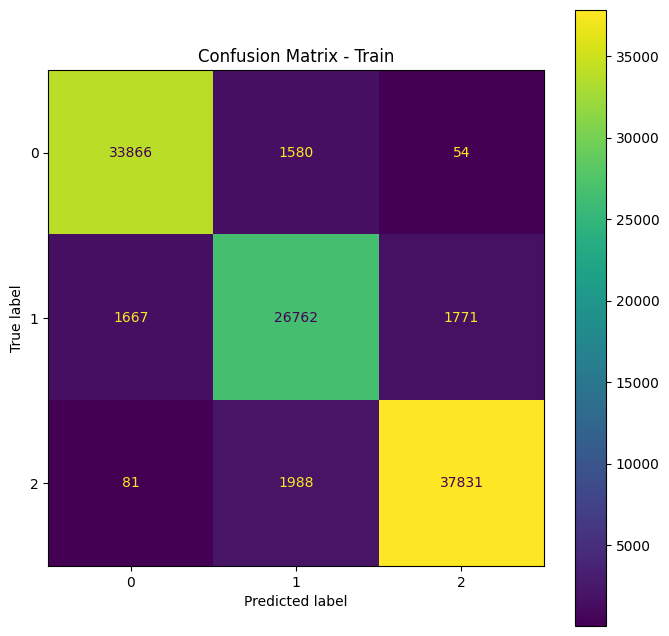

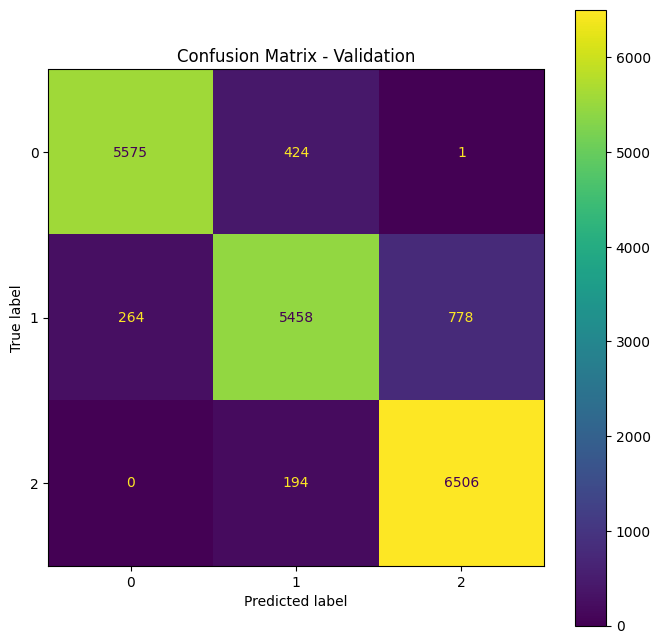

In [ ]:
lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_lstm() # efficientnet

Epoch 1/100
Train Loss: 1.0147, Train Accuracy: 62.03%
Val Loss: 0.9644, Val Accuracy: 66.15%
Epoch 2/100
Train Loss: 0.9010, Train Accuracy: 70.45%
Val Loss: 0.8687, Val Accuracy: 64.58%
Epoch 3/100
Train Loss: 0.8033, Train Accuracy: 69.79%
Val Loss: 0.7881, Val Accuracy: 65.62%
Epoch 4/100
Train Loss: 0.7264, Train Accuracy: 72.25%
Val Loss: 0.7181, Val Accuracy: 74.48%
Epoch 5/100
Train Loss: 0.6598, Train Accuracy: 74.91%
Val Loss: 0.6527, Val Accuracy: 78.12%
Epoch 6/100
Train Loss: 0.5992, Train Accuracy: 79.55%
Val Loss: 0.5897, Val Accuracy: 81.25%
Epoch 7/100
Train Loss: 0.5427, Train Accuracy: 80.87%
Val Loss: 0.5337, Val Accuracy: 82.81%
Epoch 8/100
Train Loss: 0.5010, Train Accuracy: 82.48%
Val Loss: 0.4876, Val Accuracy: 83.85%
Epoch 9/100
Train Loss: 0.4585, Train Accuracy: 83.90%
Val Loss: 0.4504, Val Accuracy: 84.90%
Epoch 10/100
Train Loss: 0.4279, Train Accuracy: 85.23%
Val Loss: 0.4201, Val Accuracy: 85.94%
Epoch 11/100
Train Loss: 0.4028, Train Accuracy: 85.80%
Val

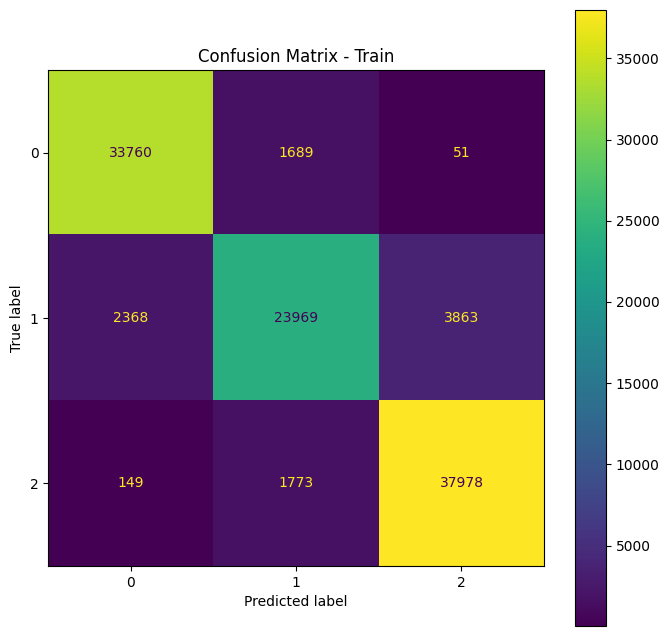

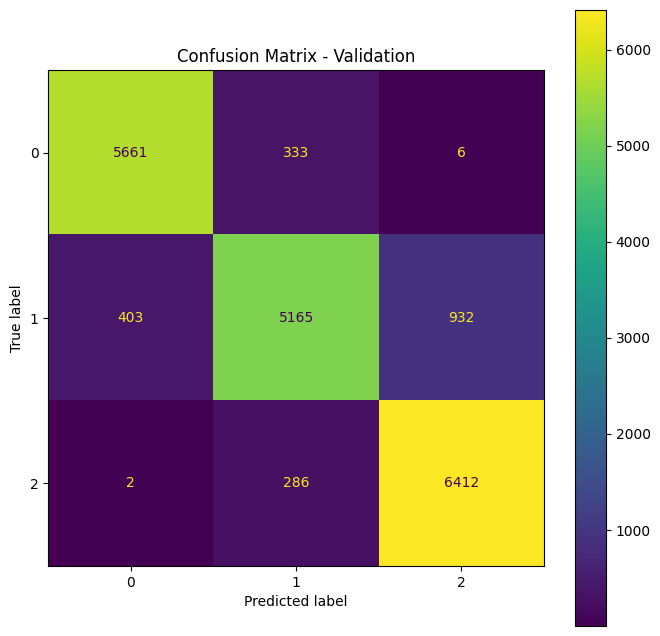

In [ ]:
lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_lstm() # preact

Epoch 1/100
Train Loss: 1.0747, Train Accuracy: 45.17%
Val Loss: 1.0090, Val Accuracy: 73.96%
Epoch 2/100
Train Loss: 0.9427, Train Accuracy: 75.85%
Val Loss: 0.8955, Val Accuracy: 74.48%
Epoch 3/100
Train Loss: 0.8269, Train Accuracy: 76.52%
Val Loss: 0.7986, Val Accuracy: 75.00%
Epoch 4/100
Train Loss: 0.7325, Train Accuracy: 77.84%
Val Loss: 0.7186, Val Accuracy: 77.08%
Epoch 5/100
Train Loss: 0.6537, Train Accuracy: 79.45%
Val Loss: 0.6498, Val Accuracy: 78.65%
Epoch 6/100
Train Loss: 0.5854, Train Accuracy: 81.72%
Val Loss: 0.5855, Val Accuracy: 82.29%
Epoch 7/100
Train Loss: 0.5216, Train Accuracy: 84.38%
Val Loss: 0.5238, Val Accuracy: 84.90%
Epoch 8/100
Train Loss: 0.4615, Train Accuracy: 86.17%
Val Loss: 0.4668, Val Accuracy: 85.42%
Epoch 9/100
Train Loss: 0.4147, Train Accuracy: 88.07%
Val Loss: 0.4157, Val Accuracy: 87.50%
Epoch 10/100
Train Loss: 0.3675, Train Accuracy: 89.58%
Val Loss: 0.3718, Val Accuracy: 89.58%
Epoch 11/100
Train Loss: 0.3280, Train Accuracy: 90.91%
Val

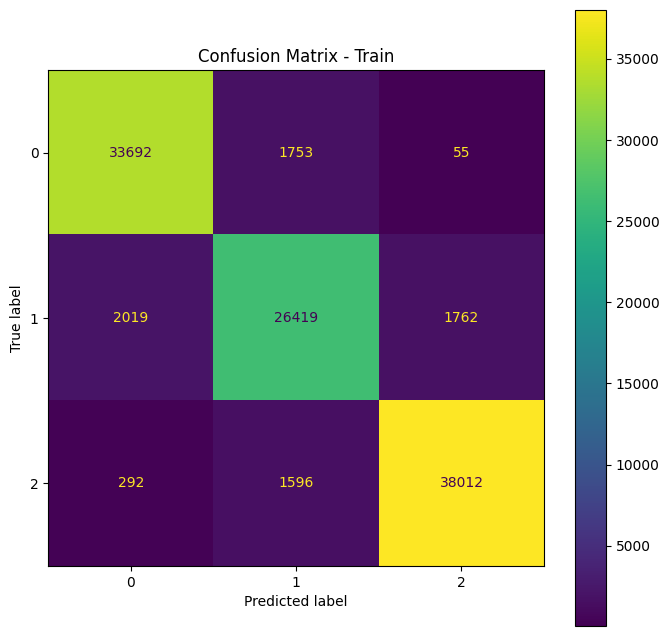

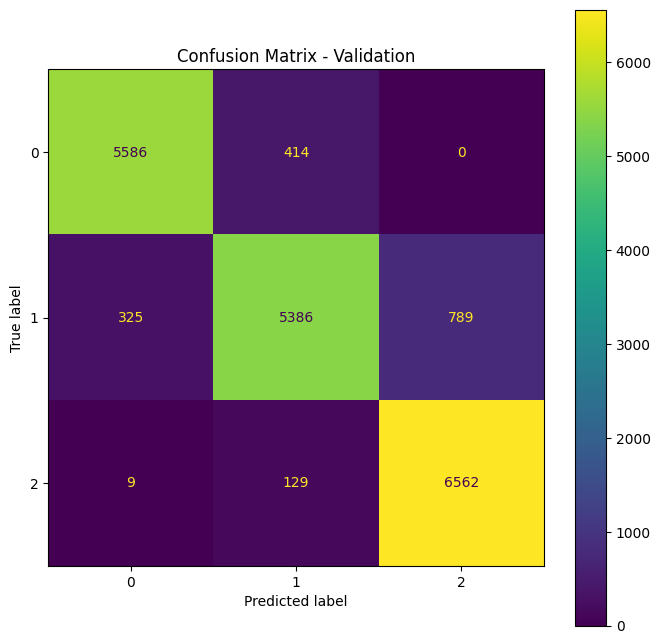

In [ ]:
lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_lstm() # eficientnetb4 on logits, not logprobs

Epoch 1/27
Train Loss: 0.9957, Train Accuracy: 61.27%
Val Loss: 0.9440, Val Accuracy: 69.27%
Epoch 2/27
Train Loss: 0.8742, Train Accuracy: 73.39%
Val Loss: 0.8398, Val Accuracy: 75.00%
Epoch 3/27
Train Loss: 0.7724, Train Accuracy: 75.66%
Val Loss: 0.7509, Val Accuracy: 76.56%
Epoch 4/27
Train Loss: 0.6838, Train Accuracy: 77.18%
Val Loss: 0.6775, Val Accuracy: 76.56%
Epoch 5/27
Train Loss: 0.6087, Train Accuracy: 78.88%
Val Loss: 0.6132, Val Accuracy: 79.17%
Epoch 6/27
Train Loss: 0.5474, Train Accuracy: 82.10%
Val Loss: 0.5510, Val Accuracy: 81.77%
Epoch 7/27
Train Loss: 0.4822, Train Accuracy: 85.04%
Val Loss: 0.4894, Val Accuracy: 84.90%
Epoch 8/27
Train Loss: 0.4264, Train Accuracy: 87.50%
Val Loss: 0.4306, Val Accuracy: 86.46%
Epoch 9/27
Train Loss: 0.3730, Train Accuracy: 88.83%
Val Loss: 0.3799, Val Accuracy: 86.98%
Epoch 10/27
Train Loss: 0.3296, Train Accuracy: 89.87%
Val Loss: 0.3400, Val Accuracy: 89.06%
Epoch 11/27
Train Loss: 0.2978, Train Accuracy: 90.72%
Val Loss: 0.31

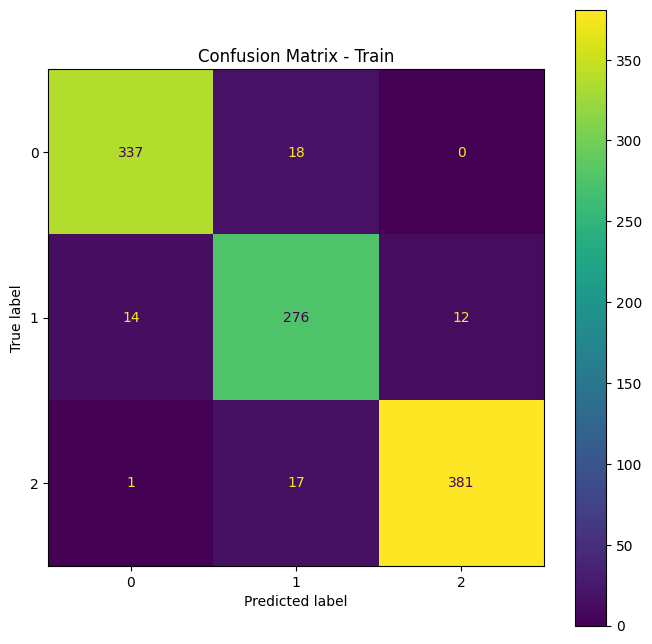

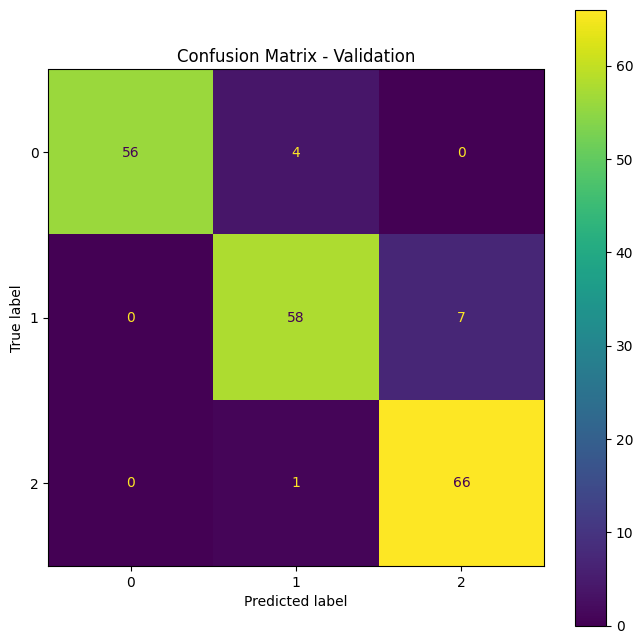

In [ ]:
lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_lstm() # eficientnetb4 on logits, not logprobs

Epoch 1/100
Train Loss: 1.0687, Train Accuracy: 45.83%
Val Loss: 1.0032, Val Accuracy: 65.62%
Epoch 2/100
Train Loss: 0.9357, Train Accuracy: 71.69%
Val Loss: 0.8901, Val Accuracy: 73.44%
Epoch 3/100
Train Loss: 0.8246, Train Accuracy: 74.62%
Val Loss: 0.7939, Val Accuracy: 74.48%
Epoch 4/100
Train Loss: 0.7285, Train Accuracy: 76.14%
Val Loss: 0.7149, Val Accuracy: 75.52%
Epoch 5/100
Train Loss: 0.6501, Train Accuracy: 79.64%
Val Loss: 0.6464, Val Accuracy: 77.60%
Epoch 6/100
Train Loss: 0.5801, Train Accuracy: 81.72%
Val Loss: 0.5795, Val Accuracy: 81.25%
Epoch 7/100
Train Loss: 0.5153, Train Accuracy: 84.00%
Val Loss: 0.5123, Val Accuracy: 84.38%
Epoch 8/100
Train Loss: 0.4522, Train Accuracy: 87.12%
Val Loss: 0.4483, Val Accuracy: 85.94%
Epoch 9/100
Train Loss: 0.3938, Train Accuracy: 89.77%
Val Loss: 0.3922, Val Accuracy: 87.50%
Epoch 10/100
Train Loss: 0.3448, Train Accuracy: 89.77%
Val Loss: 0.3490, Val Accuracy: 89.06%
Epoch 11/100
Train Loss: 0.3093, Train Accuracy: 90.72%
Val

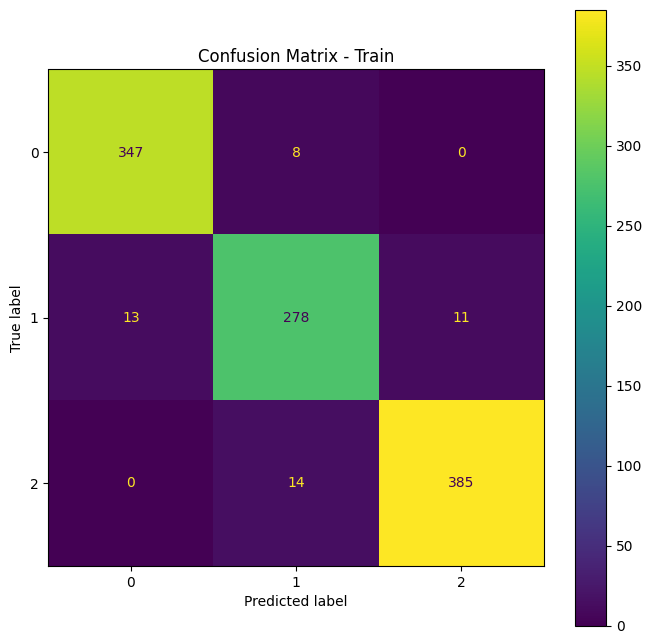

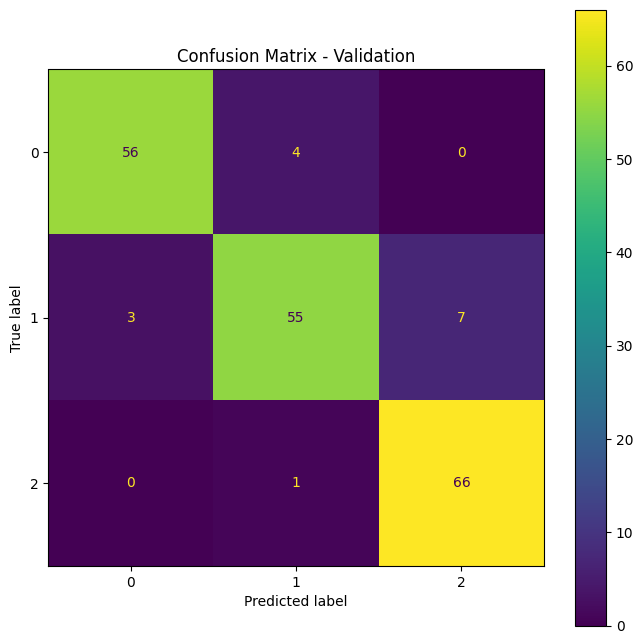

In [31]:
lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_lstm() # eficientnetb4 on logits, not logprobs

Epoch 1/40
Train Loss: 1.0735, Train Accuracy: 40.06%
Val Loss: 1.0182, Val Accuracy: 57.29%
Epoch 2/40
Train Loss: 0.9591, Train Accuracy: 63.64%
Val Loss: 0.9264, Val Accuracy: 59.90%
Epoch 3/40
Train Loss: 0.8665, Train Accuracy: 66.57%
Val Loss: 0.8534, Val Accuracy: 61.46%
Epoch 4/40
Train Loss: 0.8066, Train Accuracy: 67.71%
Val Loss: 0.7932, Val Accuracy: 66.15%
Epoch 5/40
Train Loss: 0.7412, Train Accuracy: 71.02%
Val Loss: 0.7356, Val Accuracy: 70.83%
Epoch 6/40
Train Loss: 0.6802, Train Accuracy: 73.48%
Val Loss: 0.6771, Val Accuracy: 75.52%
Epoch 7/40
Train Loss: 0.6185, Train Accuracy: 79.17%
Val Loss: 0.6174, Val Accuracy: 79.17%
Epoch 8/40
Train Loss: 0.5615, Train Accuracy: 80.30%
Val Loss: 0.5620, Val Accuracy: 81.77%
Epoch 9/40
Train Loss: 0.5158, Train Accuracy: 81.72%
Val Loss: 0.5166, Val Accuracy: 82.81%
Epoch 10/40
Train Loss: 0.4766, Train Accuracy: 83.05%
Val Loss: 0.4792, Val Accuracy: 85.42%
Epoch 11/40
Train Loss: 0.4445, Train Accuracy: 83.71%
Val Loss: 0.44

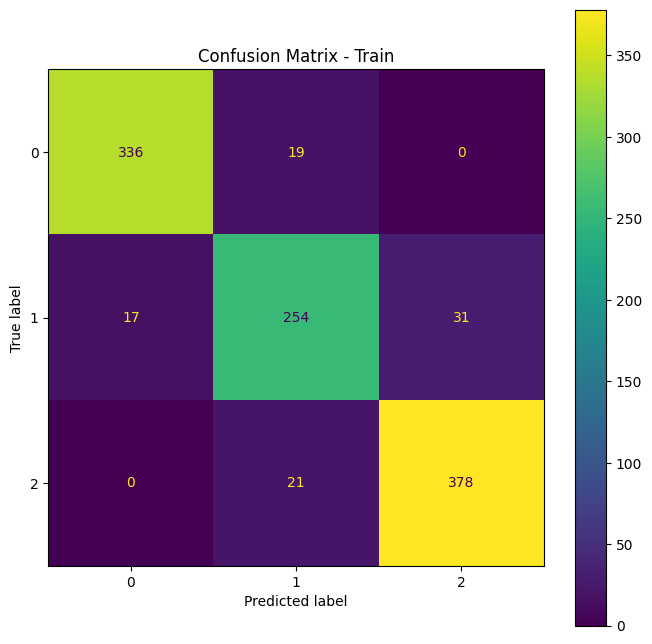

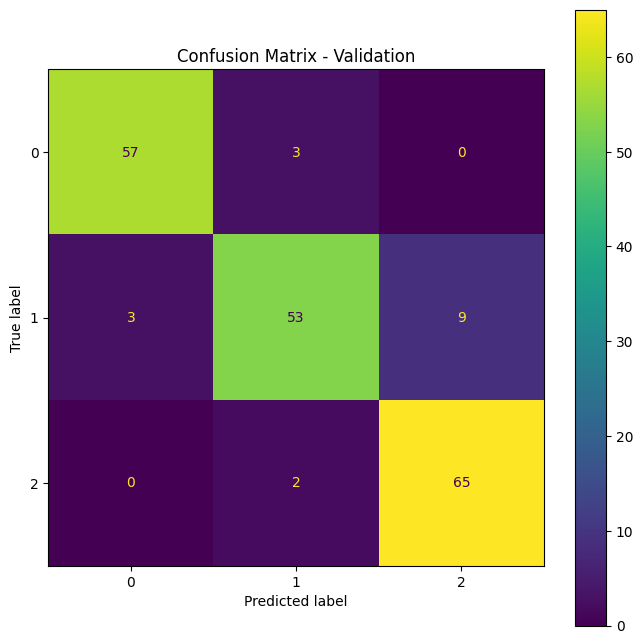

In [ ]:
lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_lstm() # preact

Epoch 1/40
Train Loss: 1.0614, Train Accuracy: 51.04%
Val Loss: 1.0054, Val Accuracy: 78.65%
Epoch 2/40
Train Loss: 0.9469, Train Accuracy: 76.99%
Val Loss: 0.9126, Val Accuracy: 74.48%
Epoch 3/40
Train Loss: 0.8563, Train Accuracy: 73.96%
Val Loss: 0.8358, Val Accuracy: 73.44%
Epoch 4/40
Train Loss: 0.7865, Train Accuracy: 73.20%
Val Loss: 0.7706, Val Accuracy: 73.96%
Epoch 5/40
Train Loss: 0.7163, Train Accuracy: 76.23%
Val Loss: 0.7095, Val Accuracy: 76.04%
Epoch 6/40
Train Loss: 0.6596, Train Accuracy: 78.12%
Val Loss: 0.6495, Val Accuracy: 78.12%
Epoch 7/40
Train Loss: 0.5979, Train Accuracy: 80.11%
Val Loss: 0.5904, Val Accuracy: 82.29%
Epoch 8/40
Train Loss: 0.5400, Train Accuracy: 81.53%
Val Loss: 0.5353, Val Accuracy: 83.33%
Epoch 9/40
Train Loss: 0.4914, Train Accuracy: 83.14%
Val Loss: 0.4884, Val Accuracy: 83.33%
Epoch 10/40
Train Loss: 0.4527, Train Accuracy: 84.47%
Val Loss: 0.4508, Val Accuracy: 84.38%
Epoch 11/40
Train Loss: 0.4229, Train Accuracy: 85.04%
Val Loss: 0.41

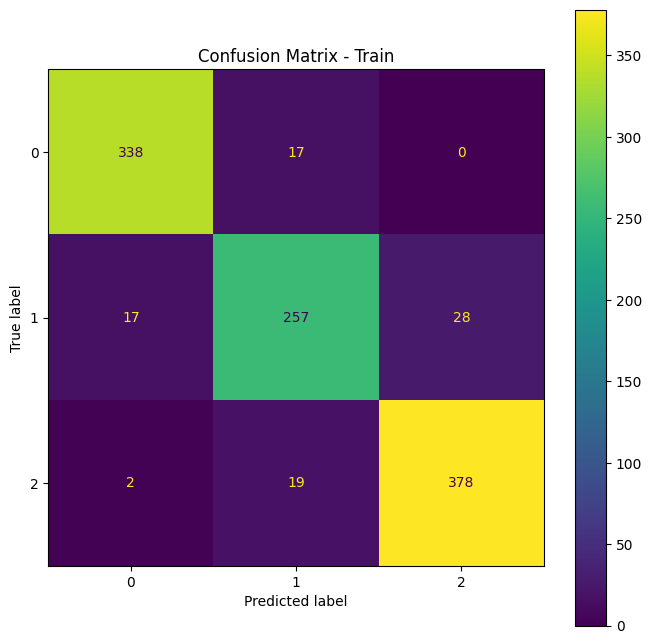

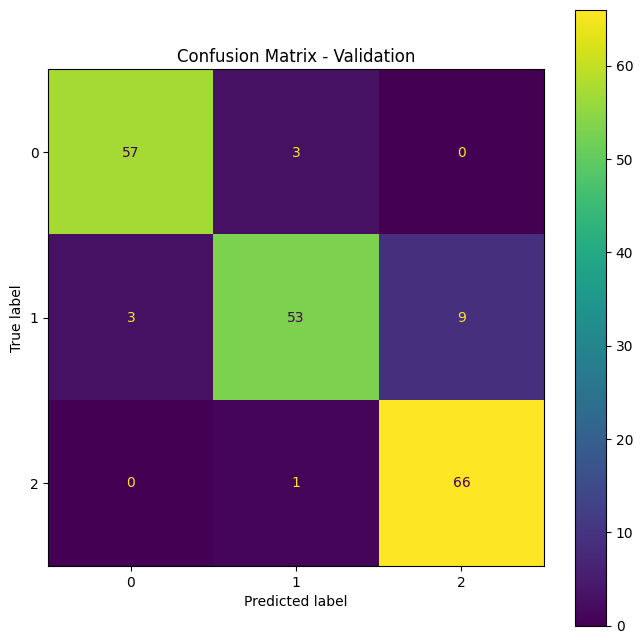

In [51]:
lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_lstm() # preact

In [ ]:
from google.colab import files
torch.save(lstm.state_dict(), "efficientnetb4_lstm.pth")


In [ ]:
files.download("efficientnetb4_lstm.pth")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

preact:<br>
Epoch 59/100 <br>
Train Loss: 0.1899, Train Accuracy: 93.47% <br>
Val Loss: 0.2221, Val Accuracy: 92.71% <br>

efficientnetb4: <br>
Epoch 65/100 <br>
Train Loss: 0.1422, Train Accuracy: 95.08% <br>
Val Loss: 0.1925, Val Accuracy: 92.71% <br>



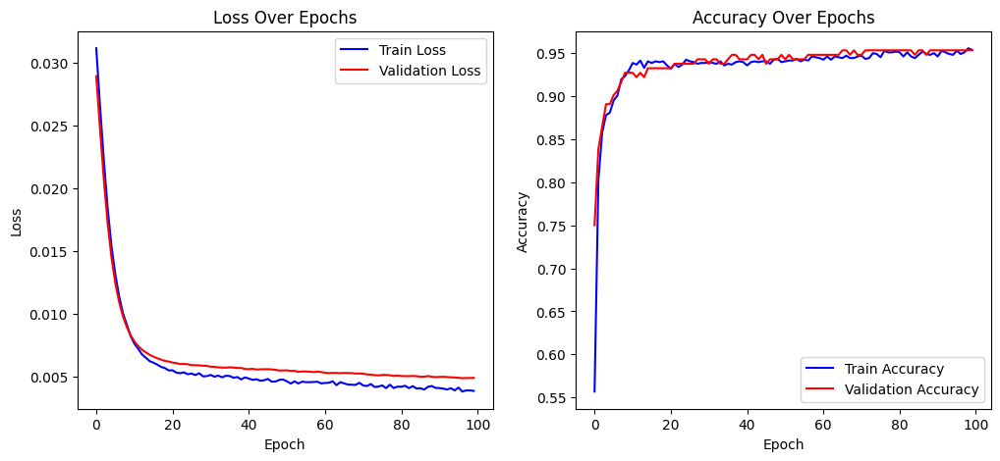

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='red')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Over Epochs")


plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", color='blue')
plt.plot(val_accuracies, label="Validation Accuracy", color='red')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Accuracy Over Epochs")

plt.show()



# resnet18 pretrained and lstm

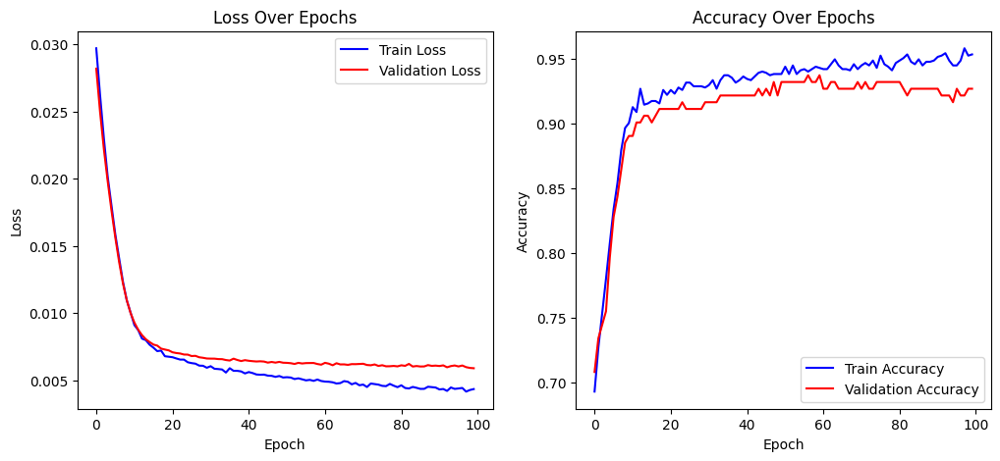

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='red')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Over Epochs")


plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", color='blue')
plt.plot(val_accuracies, label="Validation Accuracy", color='red')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Accuracy Over Epochs")

plt.show()


#efficientnetb4 pretrined and lstm

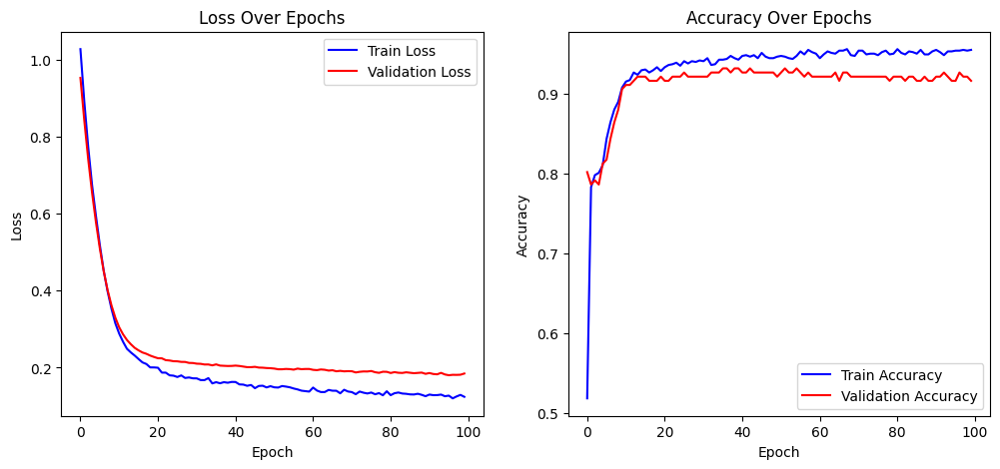

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='red')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Over Epochs")


plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", color='blue')
plt.plot(val_accuracies, label="Validation Accuracy", color='red')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Accuracy Over Epochs")

plt.show()


#efficientnetb4 pretrined and lstm

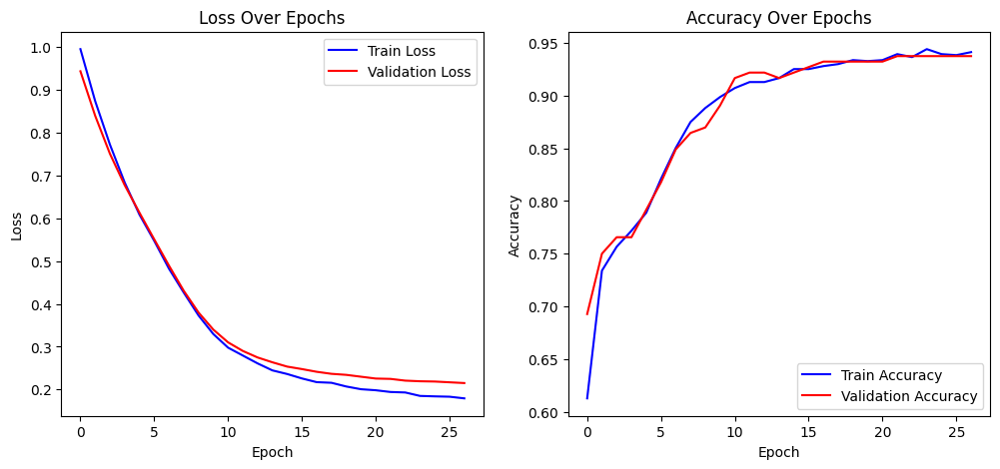

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='red')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Over Epochs")


plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", color='blue')
plt.plot(val_accuracies, label="Validation Accuracy", color='red')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Accuracy Over Epochs")

plt.show()


#efficientnetb4 pretrined and lstm

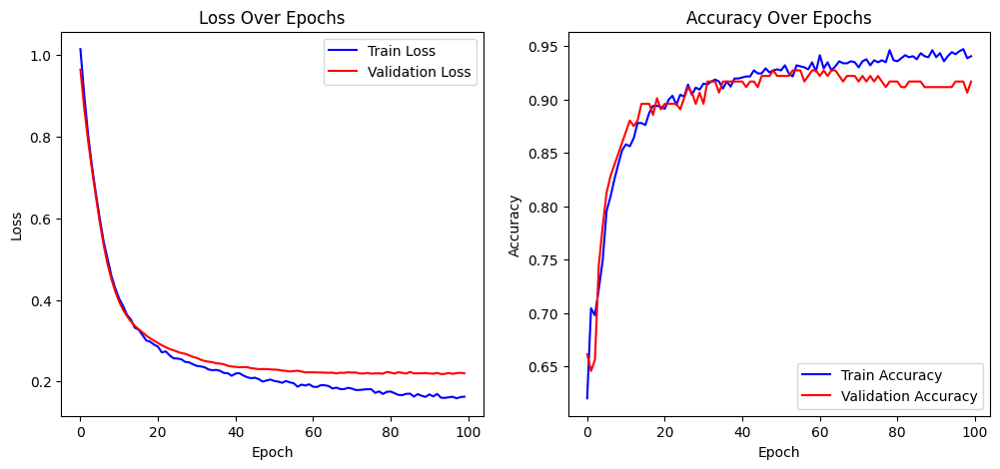

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='red')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Over Epochs")


plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", color='blue')
plt.plot(val_accuracies, label="Validation Accuracy", color='red')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Accuracy Over Epochs")

plt.show() #preact and lstm

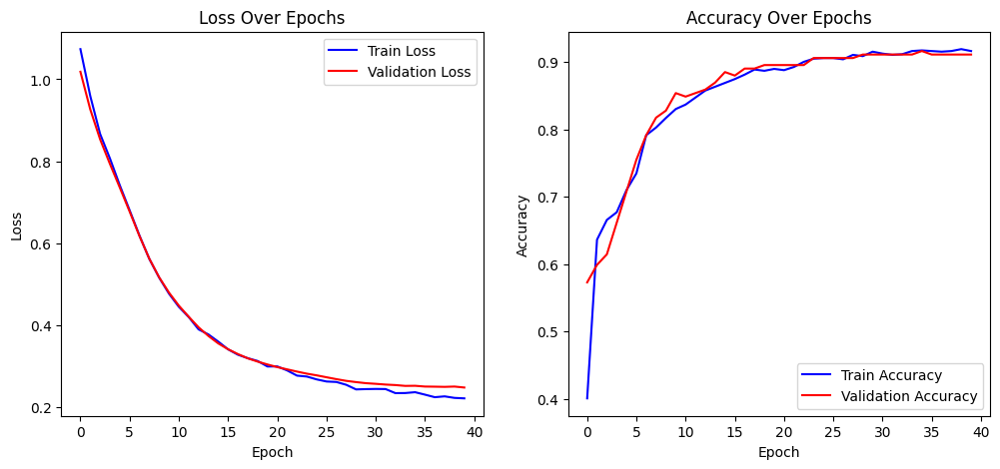

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Train Loss", color='blue')
plt.plot(val_losses, label="Validation Loss", color='red')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.title("Loss Over Epochs")


plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label="Train Accuracy", color='blue')
plt.plot(val_accuracies, label="Validation Accuracy", color='red')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Accuracy Over Epochs")

plt.show() #preact and lstm

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_phase_probabilities_sideways(
    probs: np.ndarray,
    fps: float,
    phase_names=("Left", "Middle", "Right")
):
    N = probs.shape[0]
    frames = np.arange(N)

    fig, axes = plt.subplots(1, 3, figsize=(15, 6), sharey=True)
    colors = ['tab:blue', 'tab:orange', 'tab:green']

    for i, ax in enumerate(axes):
        ax.plot(probs[:, i], frames, color=colors[i], linewidth=2)
        ax.set_title(phase_names[i])
        ax.set_xlabel("Probability")
        if i == 0:
            ax.set_ylabel("Frame #")

        ax.grid(True, linestyle='--', alpha=0.5)
        ax_time = ax.twinx()
        y_low, y_high = ax.get_ylim()
        ax_time.set_ylim(y_low, y_high)
        ax_time.invert_yaxis()

        ticks = ax.get_yticks()
        ax_time.set_yticks(ticks)
        ax_time.set_yticklabels([f"{t/fps:.1f}s" for t in ticks])
        ax_time.set_ylabel("Time (s)")

    fig.suptitle("Phase Probabilities vs Frame and Time", fontsize=16)
    plt.tight_layout()
    plt.show()


In [28]:
import torch
import numpy as np
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import DataLoader
from typing import List, Dict, Tuple

def predict_lstm_turn_phases(
    model: torch.nn.Module,
    data_loader: DataLoader,
    label_encoder: LabelEncoder,
    device: torch.device,
    img_names: List[str]
) -> Tuple[List[str], Dict[str, List[List[str]]], np.ndarray]:

    criterion = nn.CrossEntropyLoss()
    model.eval()
    all_probs_batches = []
    total_train_loss = 0
    train_correct, train_total = 0, 0
    all_true_labels = []
    all_pred_labels = []

    with torch.no_grad():
        for inputs, labels in data_loader:
            inputs, labels = inputs.to(device).float(), labels.to(device).long()

            logits = model(inputs)

            loss = criterion(logits, labels)
            total_train_loss += loss.item()


            pred_classes = logits.argmax(dim=1)
            train_correct += (pred_classes == labels).sum().item()
            train_total += labels.numel()
            probs  = torch.softmax(logits, dim=1).cpu().numpy()
            all_probs_batches.append(probs)

            all_true_labels += labels.cpu().numpy().tolist()
            all_pred_labels += pred_classes.cpu().numpy().tolist()

    train_loss = total_train_loss / train_total
    train_accuracy = train_correct / train_total

    print("test loss ", train_loss)
    print("test accuracy ", train_accuracy)
    print("Test metrics:")
    calculate_metrics(all_true_labels, all_pred_labels)
    all_probs = np.vstack(all_probs_batches)

    preds_idx    = np.argmax(all_probs, axis=1)
    turn_phases  = label_encoder.inverse_transform(preds_idx).tolist()

    phases = label_encoder.classes_
    turns_by_phase: Dict[str, List[List[str]]] = {p: [] for p in phases}

    if not turn_phases:
        return [], turns_by_phase, all_probs

    current_phase = turn_phases[0]
    current_run   = [img_names[0]]

    for phase, name in zip(turn_phases[1:], img_names[1:]):
        if phase == current_phase:
            current_run.append(name)
        else:

            turns_by_phase[current_phase].append(current_run)
            current_phase = phase
            current_run   = [name]

    turns_by_phase[current_phase].append(current_run)

    return turn_phases, turns_by_phase, all_probs


In [ ]:
turn_phases, turns_by_phase, all_probs = predict_lstm_turn_phases(lstm,
                             test_loader,
                             label_encoder,
                             device,
                             img_names_test) # preact

test loss  0.008250187849625945
test accuracy  0.9166666666666666


In [52]:
turn_phases, turns_by_phase, all_probs = predict_lstm_turn_phases(lstm,
                             test_loader,
                             label_encoder,
                             device,
                             img_names_test) # preact

test loss  0.00823695530804495
test accuracy  0.9166666666666666
Test metrics:
Accuracy: 0.9166666666666666
Precision: 0.9187881157345674
Recall: 0.9166666666666666
F1 score: 0.9169848357181131


In [ ]:
# turn_phases, turns_by_phase, all_probs = predict_lstm_turn_phases(lstm,
#                              test_loader,
#                              label_encoder,
#                              device,
#                              img_names_test) # efficientnet

test loss  0.006367842356363933
test accuracy  0.9166666666666666


In [29]:
turn_phases, turns_by_phase, all_probs = predict_lstm_turn_phases(lstm,
                             test_loader,
                             label_encoder,
                             device,
                             img_names_test) # efficientnet 27 epochs

test loss  0.00696073976966242
test accuracy  0.9166666666666666
Test metrics:
Accuracy: 0.9166666666666666
Precision: 0.9173677884615384
Recall: 0.9166666666666666
F1 score: 0.9166918642154491


In [32]:
turn_phases, turns_by_phase, all_probs = predict_lstm_turn_phases(lstm,
                             test_loader,
                             label_encoder,
                             device,
                             img_names_test) # efficientnet 100 epochs

test loss  0.006098109918336074
test accuracy  0.9270833333333334
Test metrics:
Accuracy: 0.9270833333333334
Precision: 0.9263337247294262
Recall: 0.9270833333333334
F1 score: 0.9262045513359644


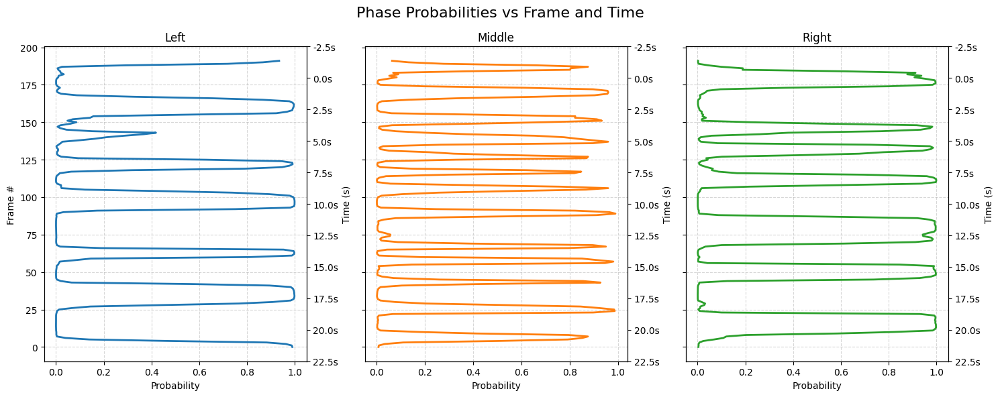

In [ ]:
plot_phase_probabilities_sideways(all_probs, fps=10.0)

In [ ]:
from torchvision import datasets, transforms, models
from torchvision.models import ResNet18_Weights



class Resnet18LSTMClassifier(nn.Module):
    def __init__(self, pretrained_resnet, pretrained_lstm, input_dim=3, hidden_dim=128, num_layers=1, output_dim=3, batch_size=8):
        super(Resnet18LSTMClassifier, self).__init__()
        self.pretrained_resnet = pretrained_resnet
        for parameter in self.pretrained_resnet.parameters():
          parameter.requires_grad = True

        self.lstm = pretrained_lstm

    def forward(self, x):
      batch_size, seq_len, C, H, W = x.shape
      x = x.view(batch_size * seq_len, C, H, W)
      logits_resnet = self.pretrained_resnet(x)


      log_probs_train = log_probs_train.view(logits_resnet, seq_len, -1)
      out = self.lstm(log_probs_train)
      return out

Label mapping:
0: left
1: middle
2: right


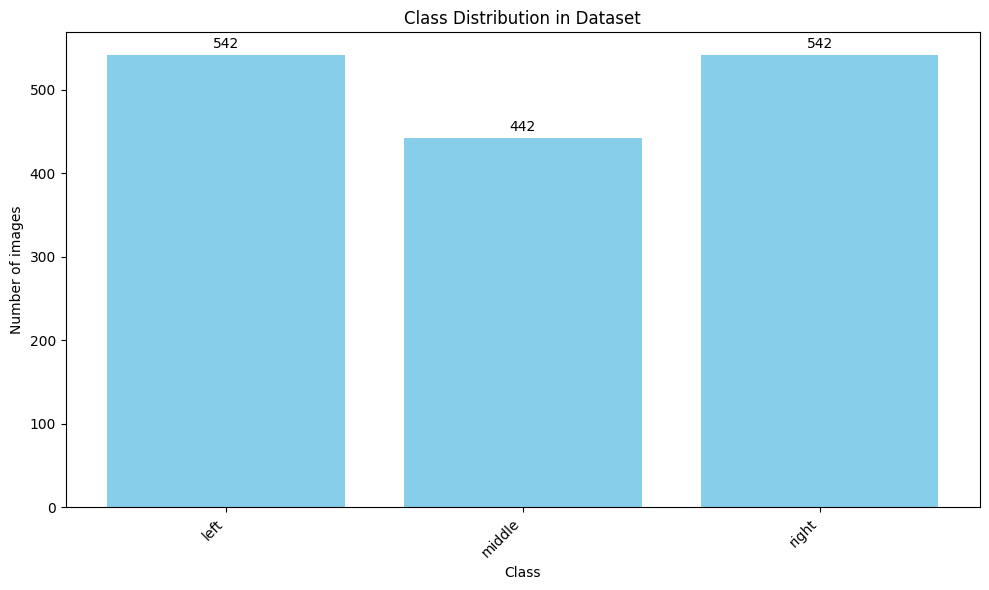

In [ ]:
from torch.utils.data import DataLoader, Dataset
import numpy as np

class SequenceImageDataset(Dataset):
    def __init__(self, image_dataset, lookback):
        self.image_dataset = image_dataset
        self.lookback = lookback

    def __len__(self):
        return len(self.image_dataset) - self.lookback + 1

    def __getitem__(self, idx):
        images, labels, names = [], [], []
        for i in range(idx, idx + self.lookback):
            img, label, name = self.image_dataset[i]
            images.append(img.unsqueeze(0))
            labels.append(label)
            names.append(name)

        images = torch.cat(images, dim=0)
        target_label = labels[-1]
        target_name = names[-1]
        return images, target_label, target_name


def load_sequence_data(transform, shuffle, sorted, lookback, batch_size=4):
    if sorted:
        dataset = CustomImageDatasetSorted(img_dir='drive/MyDrive/ski_pose_classifier/gs_training_fps10_sorted',
                                           transform=transform)
    else:
        dataset = CustomImageDataset(img_dir='drive/MyDrive/ski_pose_classifier/gs_training_fps10_sorted',
                                     transform=transform)

    label_encoder = dataset.get_label_encoder()

    sequence_dataset = SequenceImageDataset(dataset, lookback)

    full_indices = list(range(len(sequence_dataset)))
    train_indices, test_indices = train_test_split(full_indices, test_size=0.15, random_state=1, shuffle=shuffle)
    train_indices, val_indices = train_test_split(train_indices, test_size=0.176, random_state=1, shuffle=shuffle)

    train_subset = Subset(sequence_dataset, train_indices)
    val_subset = Subset(sequence_dataset, val_indices)
    test_subset = Subset(sequence_dataset, test_indices)

    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=shuffle)
    val_loader = DataLoader(val_subset, batch_size=batch_size, shuffle=shuffle)
    test_loader = DataLoader(test_subset, batch_size=batch_size, shuffle=False)

    return train_loader, val_loader, test_loader, label_encoder





from torchvision.models import EfficientNet_B4_Weights
transform = EfficientNet_B4_Weights.IMAGENET1K_V1.transforms()
# transform = ResNet18_Weights.IMAGENET1K_V1.transforms()
train_loader, val_loader, test_loader, label_encoder = load_sequence_data(transform, shuffle=False, sorted=True, lookback=10)


In [ ]:
from torch.optim.lr_scheduler import ReduceLROnPlateau

def train_and_validate_resnet18_LSTM():
  # model = Resnet18LSTMClassifier(pretrained_resnet=pretrained_resnet18)
  # model = Resnet18LSTMClassifier(pretrained_resnet=preact_resnet_model)
  model = Resnet18LSTMClassifier(pretrained_resnet=pretrained_efficient_net_b4, pretrained_lstm=lstm)

  model.to(device)
  criterion = nn.CrossEntropyLoss()
  optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)


  epochs = 100

  train_losses = []
  val_losses = []
  train_accuracies = []
  val_accuracies = []



  for epoch in range(epochs):
      model.train()
      total_train_loss = 0
      train_correct, train_total = 0, 0
      val_logits = []

      for inputs, labels, _ in train_loader:
          inputs, labels = inputs.to(device).float(), labels.to(device).long()
          optimizer.zero_grad()
          preds = model(inputs)
          loss = criterion(preds, labels)
          loss.backward()
          total_train_loss += loss.item()
          pred_classes = preds.argmax(dim=1)
          train_correct += (pred_classes == labels).sum().item()
          train_total += labels.numel()

          optimizer.step()


      train_loss = total_train_loss / train_total
      train_accuracy = train_correct / train_total
      train_losses.append(train_loss)
      train_accuracies.append(train_accuracy)


      model.eval()
      total_val_loss = 0
      val_correct, val_total = 0, 0
      batch_num = 0
      with torch.no_grad():
          for val_data in val_loader:


            inputs, val_labels, _ = val_data[0], val_data[1], val_data[2]
            inputs, val_labels = inputs.to(device).float(), val_labels.to(device).long()
            val_preds = model(inputs)

            val_loss = criterion(val_preds, val_labels)
            total_val_loss += val_loss.item()

            val_logits.append(val_preds)
            pred_classes = val_preds.argmax(dim=1)
            val_correct += (pred_classes == val_labels).sum().item()
            val_total += val_labels.numel()

            wrong_indices = pred_classes != val_labels

            batch_num += 1


      val_loss = total_val_loss / val_total
      val_accuracy = val_correct / val_total
      val_losses.append(val_loss)
      val_accuracies.append(val_accuracy)

      print(f"Epoch {epoch+1}/{epochs}")
      print(f"Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy*100:.2f}%")
      print(f"Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy*100:.2f}%")
      print("=" * 40)
  return model, train_losses, val_losses, train_accuracies, val_accuracies

In [ ]:
lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_resnet18_LSTM()# 2 hours, used pretrained resnet (finetuned) earlier and then unfreezed all layers in a hybrid

Epoch 1/100
Train Loss: 0.1126, Train Accuracy: 66.20%
Val Loss: 0.0887, Val Accuracy: 87.22%
Epoch 2/100
Train Loss: 0.0632, Train Accuracy: 91.53%
Val Loss: 0.0634, Val Accuracy: 83.26%
Epoch 3/100
Train Loss: 0.0329, Train Accuracy: 95.10%
Val Loss: 0.0645, Val Accuracy: 81.50%
Epoch 4/100
Train Loss: 0.0217, Train Accuracy: 96.33%
Val Loss: 0.0740, Val Accuracy: 81.50%
Epoch 5/100
Train Loss: 0.0207, Train Accuracy: 95.76%
Val Loss: 0.0705, Val Accuracy: 81.94%
Epoch 6/100
Train Loss: 0.0150, Train Accuracy: 96.42%
Val Loss: 0.0585, Val Accuracy: 84.58%
Epoch 7/100
Train Loss: 0.0119, Train Accuracy: 97.18%
Val Loss: 0.0487, Val Accuracy: 87.22%
Epoch 8/100
Train Loss: 0.0105, Train Accuracy: 97.36%
Val Loss: 0.0600, Val Accuracy: 84.14%
Epoch 9/100
Train Loss: 0.0092, Train Accuracy: 97.65%
Val Loss: 0.0621, Val Accuracy: 85.90%
Epoch 10/100
Train Loss: 0.0079, Train Accuracy: 97.74%
Val Loss: 0.0662, Val Accuracy: 83.70%
Epoch 11/100
Train Loss: 0.0078, Train Accuracy: 97.74%
Val

KeyboardInterrupt: 

In [ ]:
lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_resnet18_LSTM() # trained resnrt from 0 in a hybrid (finetuned resnet) did not train it  earlier
# trained on logits not log propbs

Epoch 1/100
Train Loss: 0.1239, Train Accuracy: 57.53%
Val Loss: 0.0951, Val Accuracy: 81.06%
Epoch 2/100
Train Loss: 0.0700, Train Accuracy: 87.48%
Val Loss: 0.0731, Val Accuracy: 80.18%
Epoch 3/100
Train Loss: 0.0345, Train Accuracy: 94.26%
Val Loss: 0.1040, Val Accuracy: 72.69%
Epoch 4/100
Train Loss: 0.0218, Train Accuracy: 96.61%
Val Loss: 0.0965, Val Accuracy: 73.13%
Epoch 5/100
Train Loss: 0.0164, Train Accuracy: 96.52%
Val Loss: 0.1004, Val Accuracy: 77.09%
Epoch 6/100
Train Loss: 0.0132, Train Accuracy: 97.27%
Val Loss: 0.0800, Val Accuracy: 81.94%
Epoch 7/100
Train Loss: 0.0107, Train Accuracy: 97.55%
Val Loss: 0.0725, Val Accuracy: 78.85%
Epoch 8/100
Train Loss: 0.0082, Train Accuracy: 98.31%
Val Loss: 0.0739, Val Accuracy: 82.82%
Epoch 9/100
Train Loss: 0.0082, Train Accuracy: 97.74%
Val Loss: 0.0900, Val Accuracy: 79.74%
Epoch 10/100
Train Loss: 0.0072, Train Accuracy: 98.12%
Val Loss: 0.1218, Val Accuracy: 74.45%
Epoch 11/100
Train Loss: 0.0070, Train Accuracy: 98.21%
Val

KeyboardInterrupt: 

In [ ]:
lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_resnet18_LSTM() #used cnn classifier as feature extracotr (removed fc)

Epoch 1/100
Train Loss: 0.0633, Train Accuracy: 85.88%
Val Loss: 0.0395, Val Accuracy: 89.43%
Epoch 2/100
Train Loss: 0.0229, Train Accuracy: 94.35%
Val Loss: 0.0331, Val Accuracy: 91.63%
Epoch 3/100
Train Loss: 0.0147, Train Accuracy: 96.52%
Val Loss: 0.0321, Val Accuracy: 92.07%
Epoch 4/100
Train Loss: 0.0106, Train Accuracy: 96.99%
Val Loss: 0.0321, Val Accuracy: 92.07%
Epoch 5/100
Train Loss: 0.0082, Train Accuracy: 97.55%
Val Loss: 0.0332, Val Accuracy: 92.07%
Epoch 6/100
Train Loss: 0.0070, Train Accuracy: 98.02%
Val Loss: 0.0330, Val Accuracy: 92.51%
Epoch 7/100
Train Loss: 0.0059, Train Accuracy: 98.02%
Val Loss: 0.0342, Val Accuracy: 92.95%
Epoch 8/100
Train Loss: 0.0053, Train Accuracy: 98.40%
Val Loss: 0.0349, Val Accuracy: 92.51%
Epoch 9/100
Train Loss: 0.0039, Train Accuracy: 98.87%
Val Loss: 0.0372, Val Accuracy: 92.51%


In [ ]:
lstm, train_losses, val_losses, train_accuracies, val_accuracies  = train_and_validate_resnet18_LSTM()

Epoch 1/100
Train Loss: 0.0536, Train Accuracy: 88.04%
Val Loss: 0.0389, Val Accuracy: 88.99%
Epoch 2/100
Train Loss: 0.0196, Train Accuracy: 95.86%
Val Loss: 0.0417, Val Accuracy: 87.22%
Epoch 3/100
Train Loss: 0.0122, Train Accuracy: 96.80%
Val Loss: 0.0588, Val Accuracy: 83.70%
Epoch 4/100
Train Loss: 0.0096, Train Accuracy: 96.99%
Val Loss: 0.0482, Val Accuracy: 89.43%
Epoch 5/100
Train Loss: 0.0077, Train Accuracy: 97.74%
Val Loss: 0.0551, Val Accuracy: 88.11%
Epoch 6/100
Train Loss: 0.0073, Train Accuracy: 97.65%
Val Loss: 0.0419, Val Accuracy: 90.75%


In [ ]:
import gc
torch.cuda.empty_cache()
gc.collect()

27